# 1. Imports


1. Verify hd-bet works for PET images (try with and without skull)
     -> If not look at bet2
   
3. Try in Native space rather than MNI space
   
4. Try ADC if available

5. Expand Dataset
   
     -> Check unprocessed data, ADNI data (possibly ADNI for validation later)

6. Read literature and try different architectures
   
    -> Log metrics on test set after each experiment
        (SSIM, MSE, Inception score)

If use department GPU, make sure don't hog resources (esp if running overnight)

In [1]:
import matplotlib.pyplot as plt
import multiprocessing as mp
import nibabel as nib
import numpy as np
import os
import pandas as pd
import tempfile
from sklearn import metrics
import time
from time import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from monai.networks.nets import AHNet
from tqdm import tqdm
import monai
from monai.utils import progress_bar
from monai.config import print_config
from monai.data import Dataset, DataLoader, CacheDataset
from monai.transforms import (
    Activations,
    AsDiscrete,
    Compose,
    EnsureChannelFirstd,
    EnsureTyped,
    LoadImaged,
    MapTransform,
    Orientationd,
    RandRicianNoised,
    RandRotated,
    RandFlipd,
    Resized,
    Rotate90d,
    ScaleIntensityd,
    DeleteItemsd,
    NormalizeIntensityd
)
from monai.losses.ssim_loss import SSIMLoss
import statistics

In [2]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="4,6,7"

In [3]:
%store -r dictionary_train
%store -r dictionary_valid
%store -r dictionary_test

In [4]:
# global variables
image_size = (128,128,64)

# 2. MONAI Dataloader

In [5]:
#To turn 4D images to 3D (from Ashley's classifier)
class MakeSingleVolumed(MapTransform):
    def __call__(self, data):
        for key in self.keys:
            num_volumes = data[key].shape[0]
            data["NumVolumes"] = num_volumes
            
            if num_volumes != 1:
                middle_volume = num_volumes // 2
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][middle_volume,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
            else:
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][0,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
                
        return data

#This uses the mask to scale the intensity of the image (not being used rn)
class ScaleImaged(MapTransform):
    def __call__(self, data):
            data[self.keys[0]] *= (0.4+data[self.keys[1]])

            return data

In [6]:
train_transforms = Compose(
    [
        LoadImaged(keys=["t1", "t1c", "t2", "flair", "pet"], reader=monai.data.ITKReader, image_only=True),
        EnsureChannelFirstd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Orientationd(keys=["t1", "t1c", "t2", "flair", "pet"], axcodes="RAS"),        
        EnsureTyped(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Resized(keys=["t1", "t1c", "t2", "flair", "pet"], spatial_size=image_size),
        MakeSingleVolumed(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Rotate90d(keys=["t1", "t1c", "t2", "flair", "pet"]),
        ScaleIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        NormalizeIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        RandFlipd(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.5, spatial_axis=1),
        RandRotated(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.6, range_z=0.3)
    ]
)

In [7]:
val_files = dictionary_train[:10]

check_ds = Dataset(data=val_files, transform=train_transforms)
check_DataLoader = DataLoader(check_ds, batch_size=1, shuffle=False)

It has been 18.849068641662598 seconds since the loop started


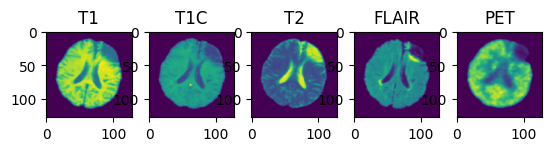

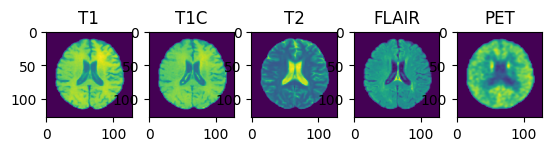

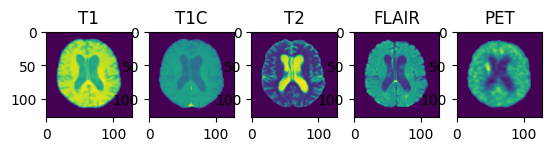

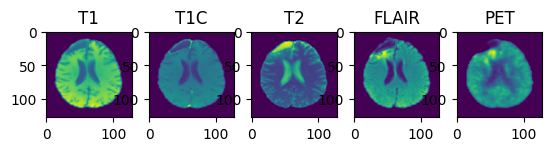

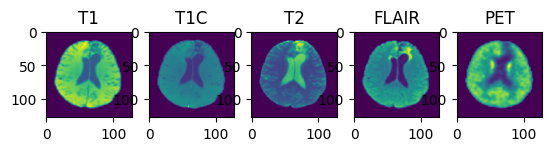

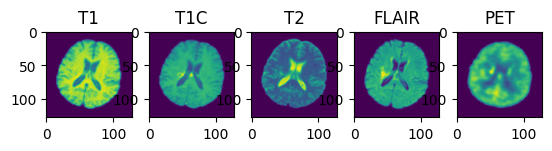

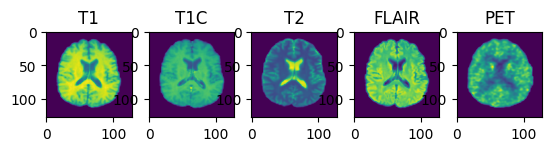

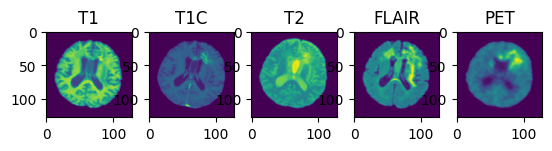

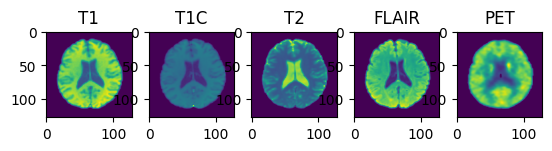

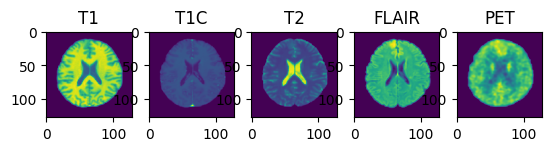

In [8]:
program_starts = time()
step = 1350
slice_index = 32
for item in check_DataLoader:
    image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index]
    
    f, axarr = plt.subplots(1, 5)
    
    axarr[0].imshow(image_datas[0])
    axarr[0].set_title("T1")
    axarr[1].imshow(image_datas[1])
    axarr[1].set_title("T1C")
    axarr[2].imshow(image_datas[2])
    axarr[2].set_title("T2")
    axarr[3].imshow(image_datas[3])
    axarr[3].set_title("FLAIR")
    axarr[4].imshow(image_datas[4])
    axarr[4].set_title("PET")
    
    step += 1
now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

In [9]:
print(os.cpu_count())

train_ds = CacheDataset(data=dictionary_train, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count(), drop_last=False)

train_metric_ds = CacheDataset(data=dictionary_train[:10], transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_metric_loader = DataLoader(train_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

valid_ds = CacheDataset(data=dictionary_valid, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
valid_loader = DataLoader(valid_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

test_ds = CacheDataset(data=dictionary_test, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

80


Loading dataset:   0%|                                  | 0/185 [00:00<?, ?it/s]

Loading dataset:   1%|▏                       | 1/185 [01:07<3:27:45, 67.75s/it]

Loading dataset:   1%|▎                       | 2/185 [01:09<1:28:31, 29.03s/it]

Loading dataset:   2%|▍                         | 3/185 [01:13<51:07, 16.85s/it]

Loading dataset:   2%|▌                         | 4/185 [01:15<34:25, 11.41s/it]

Loading dataset:   3%|▋                         | 5/185 [01:15<22:46,  7.59s/it]

Loading dataset:   3%|▊                         | 6/185 [01:17<16:04,  5.39s/it]

Loading dataset:   4%|▉                         | 7/185 [01:19<12:44,  4.30s/it]

Loading dataset:   4%|█                         | 8/185 [01:19<09:12,  3.12s/it]

Loading dataset:   5%|█▎                        | 9/185 [01:22<08:35,  2.93s/it]

Loading dataset:   5%|█▎                       | 10/185 [01:23<07:11,  2.47s/it]

Loading dataset:   6%|█▍                       | 11/185 [01:25<06:17,  2.17s/it]

Loading dataset:   6%|█▌                       | 12/185 [01:27<06:08,  2.13s/it]

Loading dataset:   7%|█▊                       | 13/185 [01:30<07:24,  2.58s/it]

Loading dataset:   8%|█▉                       | 14/185 [01:38<10:47,  3.79s/it]

Loading dataset:   8%|██                       | 15/185 [01:38<08:50,  3.12s/it]

Loading dataset:   9%|██▏                      | 16/185 [01:40<07:11,  2.56s/it]

Loading dataset:   9%|██▎                      | 17/185 [01:43<08:01,  2.87s/it]

Loading dataset:  10%|██▍                      | 18/185 [01:45<07:06,  2.56s/it]

Loading dataset:  10%|██▌                      | 19/185 [01:47<06:07,  2.21s/it]

Loading dataset:  11%|██▋                      | 20/185 [01:47<04:49,  1.76s/it]

Loading dataset:  11%|██▊                      | 21/185 [01:50<04:36,  1.69s/it]

Loading dataset:  12%|██▉                      | 22/185 [01:52<06:12,  2.29s/it]

Loading dataset:  12%|███                      | 23/185 [01:53<04:29,  1.66s/it]

Loading dataset:  13%|███▏                     | 24/185 [01:53<03:35,  1.34s/it]

Loading dataset:  14%|███▍                     | 25/185 [01:54<02:54,  1.09s/it]

Loading dataset:  14%|███▌                     | 26/185 [01:54<02:12,  1.20it/s]

Loading dataset:  15%|███▋                     | 27/185 [01:54<01:37,  1.63it/s]

Loading dataset:  15%|███▊                     | 28/185 [01:54<01:24,  1.87it/s]

Loading dataset:  16%|███▉                     | 29/185 [01:55<01:18,  1.98it/s]

Loading dataset:  16%|████                     | 30/185 [01:55<01:04,  2.42it/s]

Loading dataset:  17%|████▏                    | 31/185 [01:55<00:55,  2.77it/s]

Loading dataset:  17%|████▎                    | 32/185 [01:55<00:47,  3.23it/s]

Loading dataset:  44%|██████████▉              | 81/185 [01:58<00:06, 15.79it/s]

Loading dataset:  44%|███████████              | 82/185 [02:00<00:13,  7.75it/s]

Loading dataset:  45%|███████████▏             | 83/185 [02:04<00:24,  4.09it/s]

Loading dataset:  45%|███████████▎             | 84/185 [02:05<00:31,  3.18it/s]

Loading dataset:  46%|███████████▍             | 85/185 [02:08<00:45,  2.18it/s]

Loading dataset:  46%|███████████▌             | 86/185 [02:11<01:04,  1.53it/s]

Loading dataset:  47%|███████████▊             | 87/185 [02:13<01:20,  1.22it/s]

Loading dataset:  48%|███████████▉             | 88/185 [02:14<01:33,  1.04it/s]

Loading dataset:  58%|█████████████▉          | 107/185 [02:15<00:18,  4.21it/s]

Loading dataset:  66%|███████████████▉        | 123/185 [02:16<00:07,  7.77it/s]

Loading dataset:  82%|███████████████████▋    | 152/185 [02:16<00:01, 16.83it/s]

Loading dataset:  89%|█████████████████████▍  | 165/185 [02:16<00:01, 18.41it/s]

Loading dataset:  93%|██████████████████████▎ | 172/185 [02:16<00:00, 21.01it/s]

Loading dataset: 100%|████████████████████████| 185/185 [02:16<00:00,  1.35it/s]

Loading dataset:   0%|                                   | 0/10 [00:00<?, ?it/s]

Loading dataset:  10%|██▋                        | 1/10 [00:06<00:54,  6.05s/it]

Loading dataset: 100%|██████████████████████████| 10/10 [00:06<00:00,  1.64it/s]

Loading dataset:   0%|                                    | 0/5 [00:00<?, ?it/s]

Loading dataset:  20%|█████▌                      | 1/5 [00:03<00:15,  3.88s/it]

Loading dataset: 100%|████████████████████████████| 5/5 [00:03<00:00,  1.29it/s]

Loading dataset:   0%|                                   | 0/57 [00:00<?, ?it/s]

Loading dataset:   2%|▍                          | 1/57 [00:42<39:57, 42.81s/it]

Loading dataset:   4%|▉                          | 2/57 [00:42<16:14, 17.72s/it]

Loading dataset:   5%|█▍                         | 3/57 [00:43<08:46,  9.76s/it]

Loading dataset:   7%|█▉                         | 4/57 [00:43<05:18,  6.02s/it]

Loading dataset:  65%|████████████████▉         | 37/57 [00:43<00:06,  3.23it/s]

Loading dataset: 100%|██████████████████████████| 57/57 [00:43<00:00,  1.31it/s]

# 3. Model Setup


In [10]:
class GLA_Generator(nn.Module):
    def __init__(self):
        super(GLA_Generator, self).__init__()
        self.ahnet_global = AHNet(spatial_dims=3, in_channels=4, out_channels=16, pretrained=True)

        channels = [4, 6, 12, 6, 4]
        strides = [1, 1, 1, 1, 1]
        
        self.ahnet_1 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_2 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_3 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_4 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)

        self.conv1 = nn.Conv3d(32, 16, kernel_size=1)
        self.bn1 = nn.BatchNorm3d(16)
        self.relu = nn.ReLU()
        #self.dropout = torch.nn.Dropout(0)
        self.conv2 = nn.Conv3d(16, 1, kernel_size=1)
        self.bn2 = nn.BatchNorm3d(1)

    def forward(self, x):
        batch_size, channels, width, height, depth = x.shape
        half_width, half_height = width // 2, height // 2
        
        # Splitting the input into 4 patches
        patch_1 = x[:, :, :half_width, :half_height, :]
        patch_2 = x[:, :, :half_width, half_height:, :]
        patch_3 = x[:, :, half_width:, :half_height, :]
        patch_4 = x[:, :, half_width:, half_height:, :]

        x = self.ahnet_global(x)
        patch_1 = self.ahnet_1(patch_1)
        patch_2 = self.ahnet_2(patch_2)
        patch_3 = self.ahnet_3(patch_3)
        patch_4 = self.ahnet_4(patch_4)

        # Concatenating the processed patches
        top_row = torch.cat([patch_1, patch_2], dim=3)  # Concatenate along the height
        bottom_row = torch.cat([patch_3, patch_4], dim=3)  # Concatenate along the height
        concatenated_patches = torch.cat([top_row, bottom_row], dim=2)  # Concatenate along the width

        x = torch.cat([x, concatenated_patches], dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        #x = self.dropout(x)
        x = self.conv2(x)
        x = self.bn2(x)

        return x

### 3.1 Model and Device Setup

In [11]:
# Use GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

gen_net = GLA_Generator()

disc_net = monai.networks.nets.Discriminator(
    in_shape=(128, 128, 64),
    channels=(8, 16, 32, 64, 1),
    strides=(2, 2, 2, 2, 1),
    num_res_units=1,
    kernel_size=3,
)

# If multiple GPUs are available, run in parallel
if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    gen_net = nn.DataParallel(gen_net)
    disc_net = nn.DataParallel(disc_net)

gen_net.to(device)
disc_net.to(device)

real_label = 1
gen_label = 0

disc_loss = torch.nn.BCELoss()
gen_loss = torch.nn.BCELoss()
gen_loss2 = monai.metrics.MultiScaleSSIMMetric(spatial_dims=3, kernel_size=4)

disc_opt = torch.optim.Adam(disc_net.parameters(), 0.00018)
gen_opt = torch.optim.Adam(gen_net.parameters(), 0.00011)

def discriminator_loss(gen_images, real_images):
    """
    The discriminator loss if calculated by comparing its
    prediction for real and generated images.

    """
    real = real_images.new_full((real_images.shape[0], 1), real_label)
    gen = gen_images.new_full((gen_images.shape[0], 1), gen_label)

    # Training discriminator to label 1 on real images
    realloss = disc_loss(disc_net(real_images), real) 

    # Training discriminator to label 0 on generated images
    genloss = disc_loss(disc_net(gen_images.detach()), gen)

    return (realloss + genloss) / 2


def generator_loss(input, real_images):
    """
    The generator loss is calculated by determining how well
    the discriminator was fooled by the generated images.

    """
    output = disc_net(input[:,0,:,:,:])
    cats = output.new_full(output.shape, real_label)
    fooling_disc = gen_loss(output, cats)
    ssim = 1 - torch.mean(gen_loss2(input, real_images))
    
    # Train generator to fool the discriminator into giving a score of 1, and to have a high SSIM
    return fooling_disc + ssim

cuda


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


Let's use 3 GPUs!


### 3.2 Training


----------
epoch 1/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:29, 73.60s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:24, 32.47s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:52, 19.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:44, 13.02s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:06,  9.55s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:30,  6.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:14,  4.71s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:08,  4.28s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  4.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.38s/it]

----------
epoch 2/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:03, 71.25s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:43,  7.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.49s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.11s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.10s/it]

----------
epoch 3/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<13:00, 70.91s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.53s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.13s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 4/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.75s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:23, 32.38s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:51, 19.09s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.82s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.34s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.17s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.18s/it]

----------
epoch 5/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<13:00, 70.92s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.44s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:05,  9.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:43,  7.22s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 6/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.56s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.52s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.14s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.16s/it]

----------
epoch 7/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:53, 75.78s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:32, 33.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:57, 19.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:45, 13.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:07,  9.60s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:45,  7.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.13s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:21,  5.26s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:14,  4.69s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.23s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.50s/it]

----------
epoch 8/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:48, 75.30s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:29, 32.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:53, 19.32s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:43, 12.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:06,  9.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:45,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:30,  6.17s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:21,  5.26s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:41<00:13,  4.61s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:08,  4.18s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.44s/it]

----------
epoch 9/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:15, 77.75s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 20.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.67s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.10s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.64s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.22s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 10/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:02, 76.56s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:33, 33.38s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:56, 19.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:45, 13.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:08,  9.80s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:45,  7.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.58s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.15s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

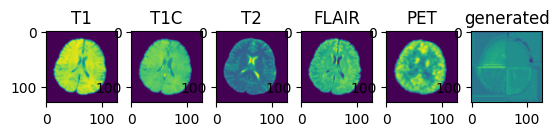

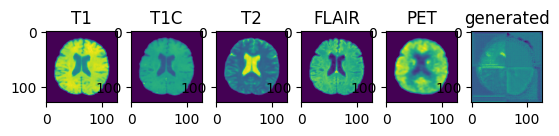

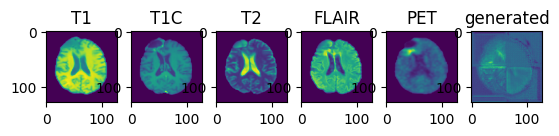

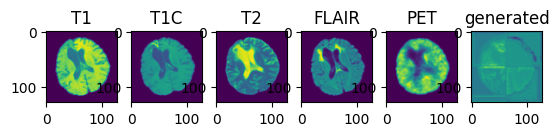

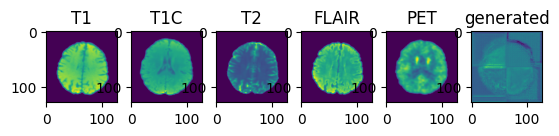

validation avg MS-SSIM: 0.1704 , train avg MS-SSIM: 0.1671
----------
epoch 11/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:40, 80.01s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:04, 20.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:49, 13.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:09,  9.91s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.24s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.63s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.22s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:04,  4.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 12/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:22, 78.42s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.19s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<03:00, 20.02s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:46,  7.78s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:31,  6.30s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:21,  5.29s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.61s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.24s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.72s/it]

----------
epoch 13/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:16, 72.38s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:43, 12.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:06,  9.54s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:14,  4.71s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:08,  4.43s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:04,  4.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.36s/it]

----------
epoch 14/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:13, 77.61s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:38, 33.88s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:08,  9.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:45,  7.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.19s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:21,  5.25s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.62s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.25s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:04,  4.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 15/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:11, 77.45s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:37, 33.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:58, 19.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.56s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.12s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.56s/it]

----------
epoch 16/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:53, 75.80s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:30, 33.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:57, 19.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:46, 13.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:08,  9.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:46,  7.67s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:31,  6.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.23s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.59s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.16s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

----------
epoch 17/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:52, 75.67s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:30, 33.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:45, 13.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:07,  9.70s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:45,  7.67s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:31,  6.23s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:21,  5.33s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:14,  4.68s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.23s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.51s/it]

----------
epoch 18/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:30, 73.69s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:24, 32.44s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:52, 19.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:05,  9.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:14,  4.67s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:08,  4.24s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.37s/it]

----------
epoch 19/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:07, 77.04s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:36, 33.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:58, 19.79s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:46, 13.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:08,  9.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:45,  7.57s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.19s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.58s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.17s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.56s/it]

----------
epoch 20/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<13:59, 76.28s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:33, 33.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:57, 19.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:46, 13.34s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:08,  9.72s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:44,  7.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.22s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.59s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.16s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.51s/it]

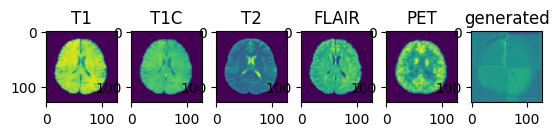

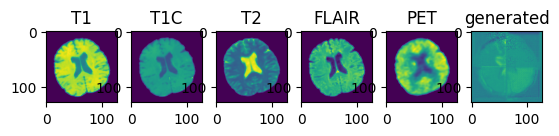

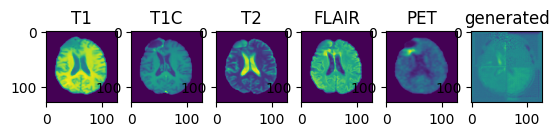

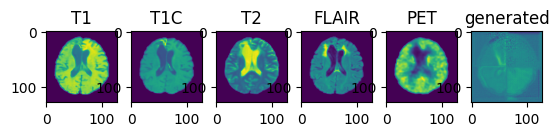

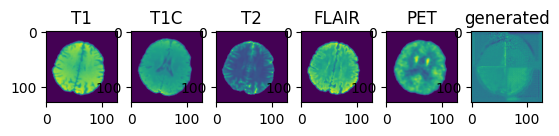

validation avg MS-SSIM: 0.2243 , train avg MS-SSIM: 0.2247
----------
epoch 21/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:08, 82.59s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 14.00s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:10, 10.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:46,  7.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:32,  6.54s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:46<00:21,  5.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:49<00:14,  4.78s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:08,  4.30s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:55<00:03,  3.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 22/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:43, 74.90s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:31, 33.10s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:44, 13.10s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:06,  9.55s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:44,  7.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:14,  4.70s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:08,  4.26s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.47s/it]

----------
epoch 23/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:54, 75.86s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:31, 33.19s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:45, 13.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:08,  9.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:45,  7.59s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:21,  5.27s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:14,  4.80s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:09,  4.56s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:04,  4.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 24/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:17, 77.98s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:40, 34.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 20.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:47, 13.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:45,  7.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:21,  5.49s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:14,  4.80s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:09,  4.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:04,  4.34s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 25/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:32, 79.29s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.52s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.57s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.38s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:14,  4.87s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.43s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:04,  4.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.82s/it]

----------
epoch 26/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:37, 79.74s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:47, 34.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:49, 13.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:10, 10.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:46,  7.75s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:32,  6.43s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:22,  5.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:14,  4.88s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.35s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:04,  4.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.87s/it]

----------
epoch 27/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:05, 76.82s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:35, 33.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:58, 19.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:46, 13.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.66s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:22,  5.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:14,  4.93s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.42s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 28/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:19, 78.15s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<03:00, 20.07s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:31,  6.34s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:22,  5.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:14,  4.91s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.40s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:04,  4.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 29/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:36, 79.66s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:47, 34.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.85s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:46,  7.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:32,  6.53s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:22,  5.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:14,  4.79s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.31s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 30/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:16, 77.84s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.19s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<03:00, 20.08s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:47, 13.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:47,  7.88s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:32,  6.40s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.40s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:14,  4.82s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.32s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

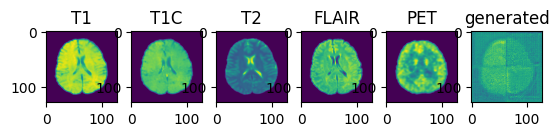

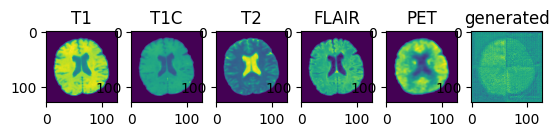

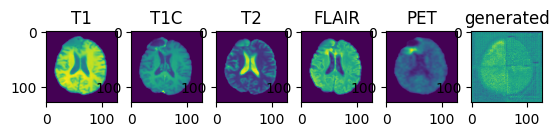

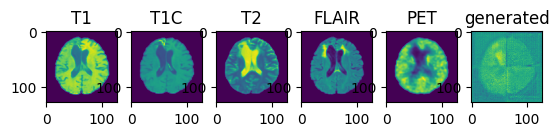

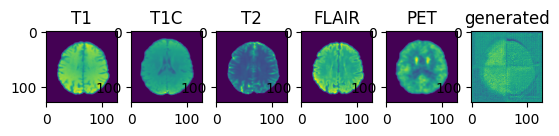

validation avg MS-SSIM: 0.2266 , train avg MS-SSIM: 0.2323
----------
epoch 31/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:03, 82.16s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:51, 13.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:10, 10.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:46,  7.72s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:31,  6.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:21,  5.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:14,  4.71s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:51<00:08,  4.26s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 32/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:08, 82.56s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:59, 35.97s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:09, 21.11s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:53, 14.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:11, 10.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:47,  7.89s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:31,  6.36s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:46<00:21,  5.40s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:49<00:14,  4.76s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:08,  4.30s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:04,  4.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.08s/it]

----------
epoch 33/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:51, 81.04s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:53, 35.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:09, 21.02s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:54, 14.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:13, 10.53s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:48,  8.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:43<00:33,  6.64s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:46<00:22,  5.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:49<00:14,  4.83s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:08,  4.35s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:04,  4.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00, 10.15s/it]

----------
epoch 34/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:25, 78.67s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:04, 20.52s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:51, 13.99s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:11, 10.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:47,  7.92s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:32,  6.45s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:21,  5.43s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:14,  4.80s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.35s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:04,  4.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00, 10.09s/it]

----------
epoch 35/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:29, 79.08s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.52s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:05, 20.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:51, 13.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:10, 10.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:46,  7.78s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:32,  6.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:21,  5.41s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:14,  4.73s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.29s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 36/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:35, 79.59s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:47, 34.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:09, 21.06s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:53, 14.16s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:11, 10.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:47,  7.84s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:31,  6.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:21,  5.37s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:14,  4.72s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.26s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:54<00:04,  4.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00, 10.15s/it]

----------
epoch 37/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:19, 78.16s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:42, 34.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.17s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:50, 13.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:13, 10.45s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:49,  8.27s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:33,  6.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:23,  5.78s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:15,  5.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:09,  4.60s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:55<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00, 10.16s/it]

----------
epoch 38/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:32<17:02, 92.93s/it]

Epoch :  17%|██████                              | 2/12 [01:36<06:42, 40.28s/it]

Epoch :  25%|█████████                           | 3/12 [01:40<03:33, 23.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:43<02:05, 15.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:48<01:21, 11.58s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:52<00:54,  9.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:56<00:36,  7.38s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:59<00:24,  6.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:03<00:15,  5.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:06<00:09,  4.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:10<00:04,  4.34s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:12<00:00,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00, 11.30s/it]

----------
epoch 39/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:31<16:46, 91.51s/it]

Epoch :  17%|██████                              | 2/12 [01:34<06:36, 39.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:38<03:27, 23.07s/it]

Epoch :  33%|████████████                        | 4/12 [01:41<02:02, 15.29s/it]

Epoch :  42%|███████████████                     | 5/12 [01:45<01:18, 11.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:49<00:52,  8.72s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:53<00:35,  7.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:57<00:24,  6.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:00<00:15,  5.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:04<00:09,  4.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:07<00:04,  4.36s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:13<00:00, 11.09s/it]

----------
epoch 40/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:30<16:32, 90.26s/it]

Epoch :  17%|██████                              | 2/12 [01:33<06:30, 39.08s/it]

Epoch :  25%|█████████                           | 3/12 [01:36<03:24, 22.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:40<02:01, 15.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:44<01:17, 11.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:47<00:50,  8.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:50<00:33,  6.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:54<00:22,  5.69s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:58<00:15,  5.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:02<00:09,  4.83s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:06<00:04,  4.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00,  3.83s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00, 10.97s/it]

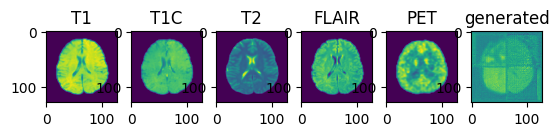

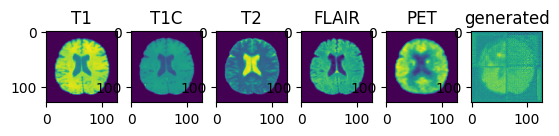

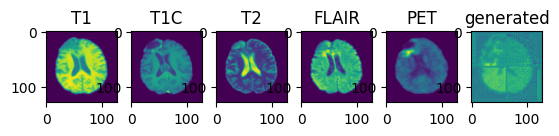

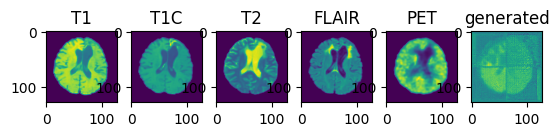

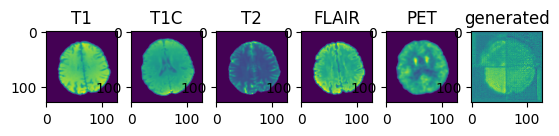

validation avg MS-SSIM: 0.2495 , train avg MS-SSIM: 0.2483
----------
epoch 41/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:29<16:26, 89.69s/it]

Epoch :  17%|██████                              | 2/12 [01:33<06:28, 38.89s/it]

Epoch :  25%|█████████                           | 3/12 [01:36<03:23, 22.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:39<02:00, 15.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:43<01:15, 10.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:46<00:49,  8.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:49<00:33,  6.69s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:53<00:22,  5.73s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:56<00:14,  4.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:00<00:09,  4.53s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:03<00:04,  4.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00, 10.72s/it]

----------
epoch 42/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:29<16:25, 89.60s/it]

Epoch :  17%|██████                              | 2/12 [01:32<06:28, 38.81s/it]

Epoch :  25%|█████████                           | 3/12 [01:36<03:24, 22.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:40<02:03, 15.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:43<01:17, 11.06s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:47<00:50,  8.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:50<00:33,  6.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:53<00:22,  5.63s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:57<00:14,  4.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:00<00:08,  4.44s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:04<00:04,  4.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:09<00:00, 10.81s/it]

----------
epoch 43/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:51, 86.48s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:15, 37.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:17, 21.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:56, 14.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:49,  8.27s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.66s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.48s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.53s/it]

----------
epoch 44/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:55, 86.83s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:17, 37.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:18, 22.02s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:13, 10.57s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:48,  8.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.62s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.88s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:09,  4.56s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.51s/it]

----------
epoch 45/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:07, 93.39s/it]

Epoch :  17%|██████                              | 2/12 [01:36<06:44, 40.50s/it]

Epoch :  25%|█████████                           | 3/12 [01:40<03:31, 23.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:43<02:04, 15.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:47<01:19, 11.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:50<00:51,  8.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:54<00:34,  6.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:57<00:23,  5.77s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:00<00:14,  4.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:04<00:08,  4.47s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:07<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:13<00:00, 11.14s/it]

----------
epoch 46/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:30<16:31, 90.13s/it]

Epoch :  17%|██████                              | 2/12 [01:33<06:31, 39.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:36<03:25, 22.79s/it]

Epoch :  33%|████████████                        | 4/12 [01:40<02:00, 15.10s/it]

Epoch :  42%|███████████████                     | 5/12 [01:43<01:16, 10.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:47<00:50,  8.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:50<00:33,  6.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:54<00:23,  5.82s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:57<00:15,  5.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:01<00:09,  4.57s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:04<00:04,  4.30s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00, 10.85s/it]

----------
epoch 47/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<16:04, 87.68s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:22, 38.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:21, 22.34s/it]

Epoch :  33%|████████████                        | 4/12 [01:38<02:01, 15.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:42<01:16, 10.91s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:45<00:49,  8.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:49<00:33,  6.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:52<00:22,  5.68s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:55<00:14,  4.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:59<00:09,  4.50s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:02<00:04,  4.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00, 10.70s/it]

----------
epoch 48/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:44, 85.87s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:13, 37.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:16, 21.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:56, 14.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:13, 10.54s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:32,  6.56s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.70s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:15,  5.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.48s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.51s/it]

----------
epoch 49/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:28<16:10, 88.23s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:22, 38.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:35<03:22, 22.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:39<02:00, 15.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:42<01:16, 10.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:45<00:49,  8.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:48<00:33,  6.66s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:52<00:22,  5.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:55<00:14,  4.86s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:58<00:08,  4.37s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:02<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00, 10.70s/it]

----------
epoch 50/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<16:05, 87.74s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:20, 38.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:19, 22.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:37<01:57, 14.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:14, 10.58s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:44<00:48,  8.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.69s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:51<00:22,  5.65s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:14,  4.93s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.42s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:01<00:04,  4.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.57s/it]

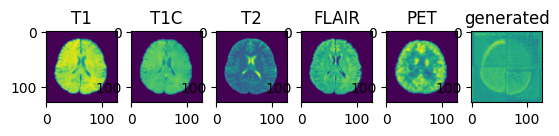

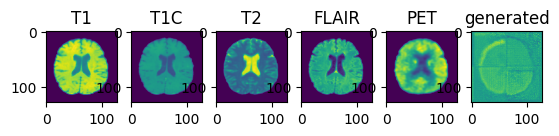

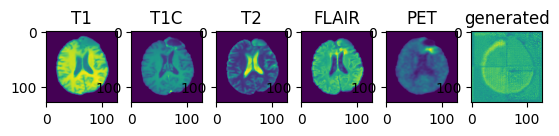

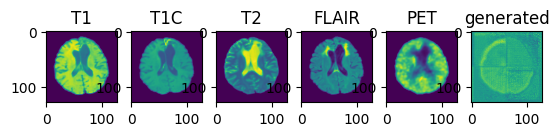

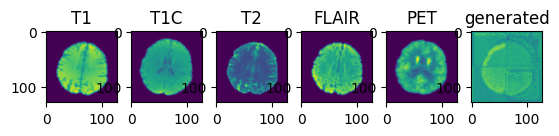

validation avg MS-SSIM: 0.1966 , train avg MS-SSIM: 0.1996
----------
epoch 51/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<15:59, 87.22s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:19, 37.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:19, 22.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:37<01:59, 14.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:42<01:17, 11.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:46<00:52,  8.79s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:49<00:34,  6.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:53<00:23,  5.81s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:56<00:15,  5.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:59<00:09,  4.54s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:03<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00, 10.73s/it]

----------
epoch 52/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:28, 84.42s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:14, 21.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:56, 14.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:13, 10.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:51,  8.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:35,  7.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:23,  5.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:15,  5.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:09,  4.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.53s/it]

----------
epoch 53/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:28<16:13, 88.49s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:24, 38.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:35<03:22, 22.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:39<02:00, 15.12s/it]

Epoch :  42%|███████████████                     | 5/12 [01:42<01:16, 10.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:47<00:52,  8.77s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:51<00:36,  7.32s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:54<00:24,  6.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:58<00:15,  5.21s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:01<00:09,  4.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:05<00:04,  4.32s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00, 10.88s/it]

----------
epoch 54/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<16:06, 87.88s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:21, 38.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:20, 22.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:37<01:57, 14.74s/it]

Epoch :  42%|███████████████                     | 5/12 [01:41<01:14, 10.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:44<00:49,  8.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:48<00:33,  6.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:51<00:22,  5.63s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:14,  4.89s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:58<00:08,  4.42s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:01<00:04,  4.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.55s/it]

----------
epoch 55/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<15:57, 87.00s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:24, 38.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:22, 22.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:38<02:00, 15.00s/it]

Epoch :  42%|███████████████                     | 5/12 [01:41<01:15, 10.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:45<00:49,  8.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:48<00:33,  6.65s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:51<00:22,  5.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:14,  4.86s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:58<00:09,  4.54s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:02<00:04,  4.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00, 10.65s/it]

----------
epoch 56/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:42, 85.71s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:12, 37.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:15, 21.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:55, 14.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:13, 10.48s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:49,  8.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:33,  6.61s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:22,  5.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.88s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.42s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.38s/it]

----------
epoch 57/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<15:01, 81.97s/it]

Epoch :  17%|██████                              | 2/12 [01:25<06:00, 36.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:10, 21.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:53, 14.16s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:12, 10.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:47,  7.91s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:31,  6.38s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:21,  5.38s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:49<00:14,  4.72s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:08,  4.43s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:04,  4.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00, 10.14s/it]

----------
epoch 58/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:38, 85.36s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:11, 37.17s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:15, 21.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:55, 14.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:33,  6.69s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:22,  5.64s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.49s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.39s/it]

----------
epoch 59/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:13, 83.03s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:01, 36.17s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:11, 21.30s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:54, 14.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:12, 10.37s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:48,  8.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:43<00:32,  6.53s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:22,  5.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:14,  4.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:54<00:08,  4.47s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:57<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00, 10.25s/it]

----------
epoch 60/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:47, 86.10s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:14, 37.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:16, 21.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:48,  8.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:33,  6.66s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.65s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.43s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.51s/it]

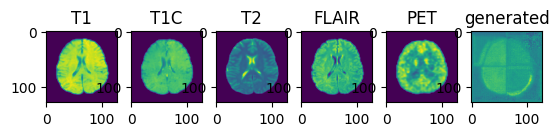

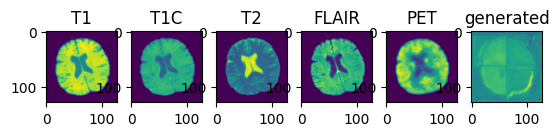

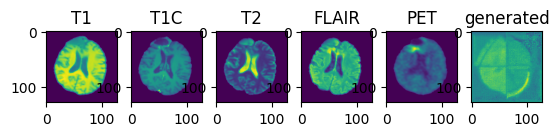

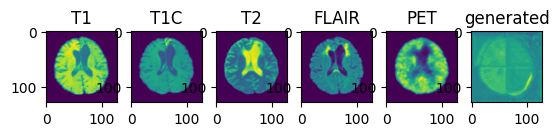

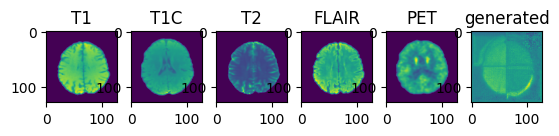

validation avg MS-SSIM: 0.2311 , train avg MS-SSIM: 0.2399
----------
epoch 61/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:18, 83.49s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:03, 36.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:11, 21.32s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:56, 14.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:13, 10.47s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:48,  8.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:32,  6.48s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:21,  5.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:14,  4.79s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:54<00:08,  4.33s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:57<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00, 10.24s/it]

----------
epoch 62/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<16:00, 87.32s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:20, 38.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:19, 22.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:37<01:57, 14.74s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:14, 10.60s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:44<00:48,  8.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.71s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:51<00:22,  5.67s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:14,  4.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:58<00:08,  4.45s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:01<00:04,  4.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.57s/it]

----------
epoch 63/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:08, 82.59s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:12, 21.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:54, 14.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:12, 10.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:48,  8.00s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:43<00:32,  6.45s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:22,  5.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:14,  4.83s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:53<00:08,  4.35s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:57<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00, 10.21s/it]

----------
epoch 64/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:22, 83.83s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:04, 36.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:12, 21.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:54, 14.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:12, 10.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:48,  8.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:32,  6.53s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:22,  5.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:51<00:14,  4.83s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:54<00:08,  4.38s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:57<00:04,  4.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00, 10.24s/it]

----------
epoch 65/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:59, 81.77s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:56, 35.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:09, 21.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:53, 14.15s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:11, 10.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:47,  7.91s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:32,  6.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:21,  5.43s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:49<00:14,  4.87s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:08,  4.40s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:04,  4.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.08s/it]

----------
epoch 66/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:46, 86.08s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:14, 37.45s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:16, 21.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.60s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:49,  8.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:33,  6.64s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.68s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.46s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.55s/it]

----------
epoch 67/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:11, 82.91s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.08s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:10, 21.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:52, 14.09s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:11, 10.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:39<00:47,  7.85s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:43<00:32,  6.60s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:46<00:22,  5.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:49<00:14,  4.81s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:53<00:08,  4.36s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:04,  4.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00, 10.12s/it]

----------
epoch 68/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:37, 85.22s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:13, 37.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:16, 21.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:56, 14.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:13, 10.54s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:32,  6.56s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:22,  5.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.88s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.49s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.41s/it]

----------
epoch 69/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:35, 85.05s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:10, 37.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:16, 21.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:56, 14.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.67s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:32,  6.59s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:22,  5.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.84s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.46s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.41s/it]

----------
epoch 70/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:35, 85.05s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:09, 36.98s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:14, 21.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:54, 14.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:12, 10.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:47,  7.96s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:32,  6.43s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:48<00:21,  5.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:51<00:14,  4.93s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:55<00:08,  4.41s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:58<00:04,  4.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.36s/it]

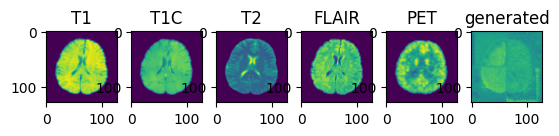

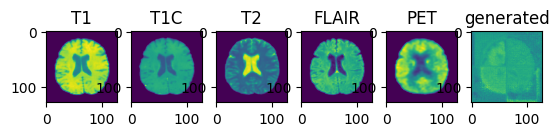

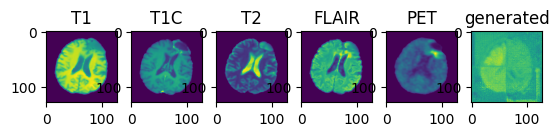

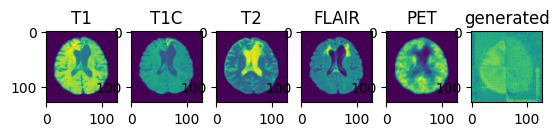

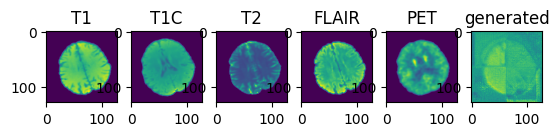

validation avg MS-SSIM: 0.2100 , train avg MS-SSIM: 0.2096
----------
epoch 71/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:52, 86.63s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:18, 37.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:18, 22.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:13, 10.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:48,  8.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.64s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.67s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:55<00:15,  5.26s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:58<00:09,  4.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:01<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00, 10.59s/it]

----------
epoch 72/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:32, 84.77s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:08, 36.88s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:14, 21.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:57, 14.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.59s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:32,  6.56s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:48<00:22,  5.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.85s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:55<00:08,  4.42s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.41s/it]

----------
epoch 73/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:54, 86.74s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:17, 37.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:18, 22.02s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.66s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:14, 10.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:49,  8.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:51<00:22,  5.70s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:14,  4.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.43s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.50s/it]

----------
epoch 74/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:31, 84.71s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:09, 36.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:16, 21.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:56, 14.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:13, 10.51s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:32,  6.52s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:48<00:22,  5.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.85s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:09,  4.57s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.67s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00, 10.44s/it]

----------
epoch 75/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:28, 84.42s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.70s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:13, 21.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:55, 14.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:13, 10.44s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:49,  8.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:33,  6.63s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:48<00:22,  5.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.89s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:55<00:08,  4.41s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:58<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00, 10.32s/it]

----------
epoch 76/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:59, 81.76s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:55, 35.56s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:07, 20.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:51, 13.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:10, 10.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:46,  7.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:31,  6.34s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:21,  5.40s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:14,  4.82s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:08,  4.48s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:55<00:04,  4.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 77/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:23, 83.99s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:06, 36.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:13, 21.49s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:55, 14.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:12, 10.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:48,  8.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:32,  6.53s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:48<00:22,  5.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:51<00:14,  4.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:55<00:09,  4.53s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:58<00:04,  4.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.37s/it]

----------
epoch 78/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:23<15:21, 83.80s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:05, 36.53s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:12, 21.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:54, 14.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:37<01:12, 10.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:48,  8.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:33,  6.61s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:22,  5.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:51<00:14,  4.87s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:54<00:08,  4.39s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:57<00:04,  4.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00, 10.26s/it]

----------
epoch 79/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:36, 85.17s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:10, 37.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:16, 21.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:56, 14.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:13, 10.51s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:32,  6.58s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:22,  5.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.89s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:09,  4.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.35s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00, 10.49s/it]

----------
epoch 80/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:46, 86.08s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:15, 37.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:17, 21.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:56, 14.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:49,  8.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:33,  6.61s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:22,  5.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.90s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.46s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.41s/it]

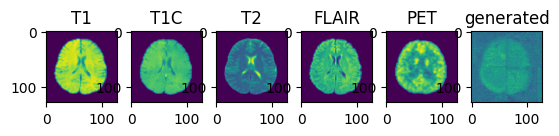

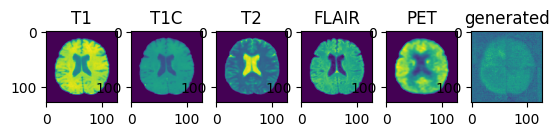

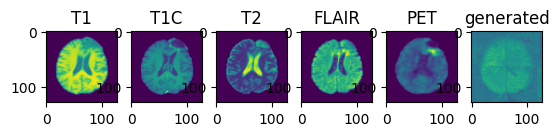

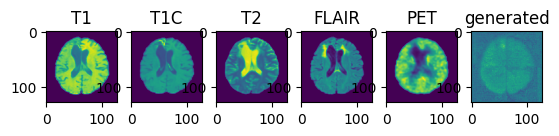

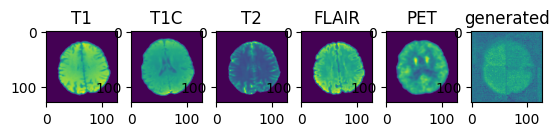

validation avg MS-SSIM: 0.3252 , train avg MS-SSIM: 0.3199
----------
epoch 81/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:36, 85.17s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:12, 37.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:19, 22.21s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:58, 14.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:15, 10.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:44<00:50,  8.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.64s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:14,  4.93s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.48s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:01<00:04,  4.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00,  3.83s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00, 10.60s/it]

----------
epoch 82/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<16:03, 87.61s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:22, 38.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:22, 22.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:38<02:00, 15.04s/it]

Epoch :  42%|███████████████                     | 5/12 [01:42<01:16, 10.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:46<00:51,  8.61s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:49<00:34,  6.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:53<00:23,  5.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:57<00:15,  5.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:01<00:09,  4.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:05<00:04,  4.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00, 10.89s/it]

----------
epoch 83/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:29, 84.49s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:13, 21.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:55, 14.40s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:13, 10.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:48,  8.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:32,  6.55s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:48<00:22,  5.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:15,  5.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:09,  4.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.36s/it]

----------
epoch 84/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:30, 84.56s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:07, 36.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:13, 21.48s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:57, 14.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:14, 10.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:33,  6.65s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:22,  5.70s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.47s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00, 10.44s/it]

----------
epoch 85/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:54, 86.74s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:16, 37.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:18, 22.03s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.68s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:14, 10.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:48,  8.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.63s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:14,  4.92s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.44s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:03<00:00,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00, 10.50s/it]

----------
epoch 86/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:32, 84.77s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:10, 37.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:16, 21.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:56, 14.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:13, 10.53s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:48,  8.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:45<00:32,  6.52s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:48<00:22,  5.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:52<00:14,  4.84s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:55<00:08,  4.40s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.38s/it]

----------
epoch 87/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:46, 86.04s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:14, 37.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:17, 21.93s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.57s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:49,  8.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.90s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.46s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00, 10.50s/it]

----------
epoch 88/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:47, 86.13s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:15, 37.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:17, 21.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:13, 10.57s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:48,  8.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:32,  6.57s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:57<00:08,  4.48s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00, 10.50s/it]

----------
epoch 89/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:36, 85.17s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:10, 37.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:14, 21.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:35<01:57, 14.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:15, 10.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:42<00:49,  8.25s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:33,  6.63s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:49<00:22,  5.59s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.93s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.42s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:59<00:04,  4.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:01<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00, 10.44s/it]

----------
epoch 90/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:26<15:53, 86.69s/it]

Epoch :  17%|██████                              | 2/12 [01:30<06:17, 37.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:33<03:18, 22.06s/it]

Epoch :  33%|████████████                        | 4/12 [01:37<01:57, 14.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:40<01:15, 10.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:44<00:49,  8.24s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:47<00:33,  6.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:51<00:23,  5.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:55<00:15,  5.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:58<00:09,  4.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:03<00:04,  4.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00,  3.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:09<00:00, 10.80s/it]

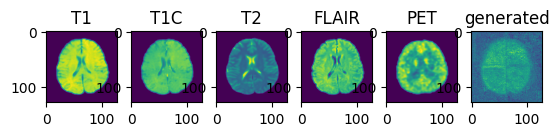

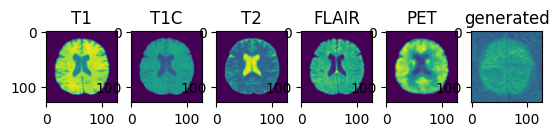

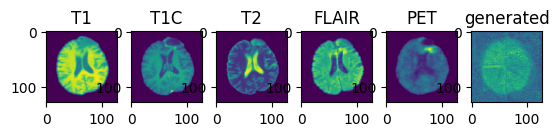

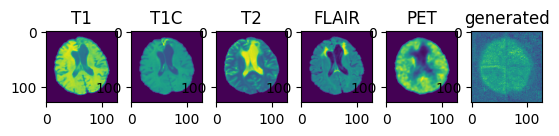

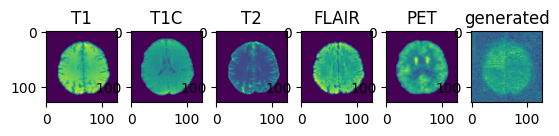

validation avg MS-SSIM: 0.3450 , train avg MS-SSIM: 0.3367
----------
epoch 91/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:34<17:15, 94.13s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:48, 40.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:41<03:33, 23.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:44<02:05, 15.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:47<01:18, 11.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:51<00:51,  8.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:55<00:35,  7.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:58<00:23,  5.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:02<00:15,  5.23s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:05<00:09,  4.73s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:10<00:04,  4.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:12<00:00,  3.81s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00, 11.29s/it]

----------
epoch 92/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:30<16:40, 90.96s/it]

Epoch :  17%|██████                              | 2/12 [01:34<06:33, 39.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:38<03:29, 23.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:41<02:03, 15.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:45<01:17, 11.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:48<00:50,  8.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:51<00:34,  6.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:55<00:22,  5.74s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:58<00:15,  5.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:02<00:08,  4.50s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:05<00:04,  4.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00, 10.95s/it]

----------
epoch 93/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:28<16:16, 88.81s/it]

Epoch :  17%|██████                              | 2/12 [01:32<06:27, 38.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:36<03:25, 22.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:40<02:02, 15.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:44<01:19, 11.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:48<00:52,  8.75s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:52<00:36,  7.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:56<00:24,  6.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:59<00:15,  5.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:02<00:09,  4.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:06<00:04,  4.30s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00, 10.96s/it]

----------
epoch 94/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:27<16:01, 87.41s/it]

Epoch :  17%|██████                              | 2/12 [01:31<06:22, 38.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:34<03:20, 22.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:37<01:58, 14.79s/it]

Epoch :  42%|███████████████                     | 5/12 [01:41<01:14, 10.67s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:44<00:49,  8.27s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:48<00:33,  6.64s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:51<00:22,  5.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:54<00:14,  4.87s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:58<00:08,  4.41s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:01<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:06<00:00, 10.58s/it]

----------
epoch 95/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:25<15:45, 85.95s/it]

Epoch :  17%|██████                              | 2/12 [01:29<06:13, 37.35s/it]

Epoch :  25%|█████████                           | 3/12 [01:32<03:15, 21.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:36<01:57, 14.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:39<01:14, 10.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:43<00:49,  8.27s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:46<00:33,  6.63s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:50<00:22,  5.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:53<00:14,  4.88s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:56<00:08,  4.40s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:00<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:05<00:00, 10.48s/it]

----------
epoch 96/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:24<15:34, 84.97s/it]

Epoch :  17%|██████                              | 2/12 [01:28<06:09, 36.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:31<03:14, 21.58s/it]

Epoch :  33%|████████████                        | 4/12 [01:34<01:54, 14.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:38<01:12, 10.38s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:41<00:47,  7.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:32,  6.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:21,  5.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:51<00:14,  4.85s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:54<00:08,  4.35s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:58<00:03,  4.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00, 10.22s/it]

----------
epoch 97/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:12, 77.50s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:39, 33.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:52, 14.08s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:11, 10.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:46,  7.82s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:31,  6.38s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:14,  4.74s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.30s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 98/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:01, 76.52s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:34, 33.44s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:56, 19.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:45, 13.16s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:07,  9.60s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.17s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.24s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.60s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:08,  4.17s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.46s/it]

----------
epoch 99/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:03, 76.66s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:34, 33.44s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:58, 19.87s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:46, 13.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:08,  9.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.25s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.65s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.22s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:04,  4.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.56s/it]

----------
epoch 100/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:06, 82.39s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:58, 35.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:08, 20.96s/it]

Epoch :  33%|████████████                        | 4/12 [01:32<01:51, 13.96s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:10, 10.09s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:47,  7.90s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:42<00:31,  6.39s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:21,  5.40s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:48<00:14,  4.75s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:08,  4.27s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:55<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

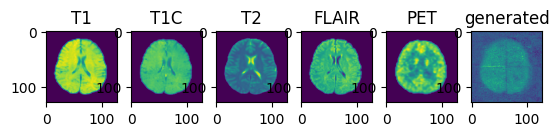

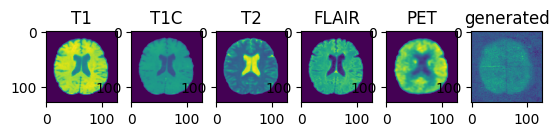

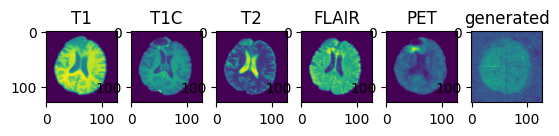

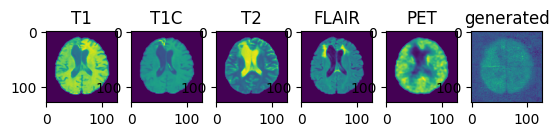

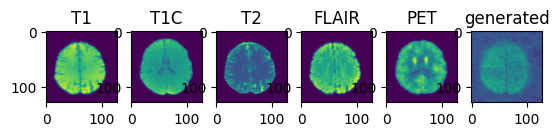

validation avg MS-SSIM: 0.3803 , train avg MS-SSIM: 0.3712
----------
epoch 101/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:25, 78.64s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:42, 34.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:09,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:21,  5.27s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.66s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.21s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.67s/it]

----------
epoch 102/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:06, 76.96s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:36, 33.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:45, 13.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:07,  9.60s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:44,  7.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.65s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.20s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.48s/it]

----------
epoch 103/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:12, 77.49s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:38, 33.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.96s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:48, 13.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:09,  9.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:45,  7.65s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:31,  6.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:21,  5.28s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.66s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.27s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:04,  4.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 104/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:27, 78.89s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.19s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:48, 13.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:31,  6.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.30s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.64s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.19s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.69s/it]

----------
epoch 105/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:52, 75.71s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:34, 33.47s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:56, 19.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:45, 13.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:06,  9.55s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:30,  6.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.55s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:08,  4.26s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.45s/it]

----------
epoch 106/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:21, 78.35s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<03:00, 20.04s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:09,  9.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:45,  7.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.21s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.64s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.22s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

----------
epoch 107/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:39, 74.46s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:25, 32.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:52, 19.19s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:42, 12.86s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:05,  9.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.25s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:13,  4.60s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:08,  4.19s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.30s/it]

----------
epoch 108/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:12, 77.49s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:37, 33.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:58, 19.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:08,  9.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.11s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.54s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.12s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 109/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:17, 77.92s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:40, 34.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.99s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:08,  9.72s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:45,  7.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:31,  6.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:21,  5.30s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.64s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.25s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.62s/it]

----------
epoch 110/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:32, 79.35s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.89s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:49, 13.68s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:09,  9.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.19s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.26s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.67s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.34s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:04,  4.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

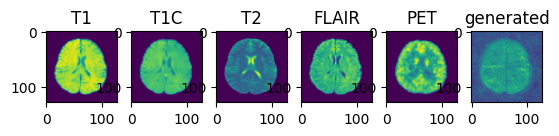

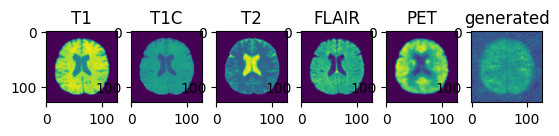

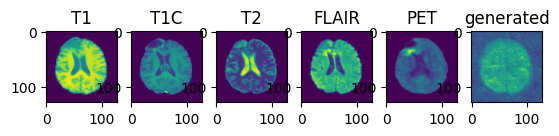

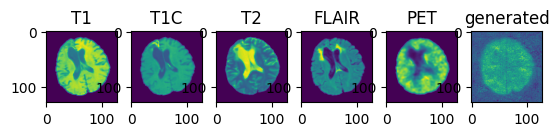

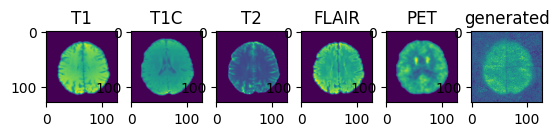

validation avg MS-SSIM: 0.4027 , train avg MS-SSIM: 0.3940
----------
epoch 111/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:13, 77.58s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:38, 33.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.34s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:45,  7.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.13s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:21,  5.25s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:14,  4.71s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.26s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.36s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.60s/it]

----------
epoch 112/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:30, 79.14s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:47, 34.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:49, 13.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:10, 10.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:46,  7.72s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:31,  6.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.28s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.63s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.20s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

----------
epoch 113/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:30, 79.17s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.47s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.17s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:08,  9.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.23s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:14,  4.67s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.22s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 114/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<13:58, 76.24s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:34, 33.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:45, 13.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:10, 10.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:46,  7.77s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:31,  6.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:21,  5.32s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:14,  4.73s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.26s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.36s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 115/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:44, 80.40s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:09,  9.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:46,  7.67s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:31,  6.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:21,  5.38s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:14,  4.69s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.39s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:04,  4.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.87s/it]

----------
epoch 116/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:30, 79.12s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.45s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:08,  9.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.66s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:31,  6.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:21,  5.28s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.62s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.23s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 117/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:46, 80.63s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:50, 35.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:04, 20.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:09,  9.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.66s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:31,  6.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:21,  5.28s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:14,  4.76s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.28s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:04,  4.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 118/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:51, 75.57s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:30, 33.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:55, 19.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:44, 13.06s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:07,  9.65s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:30,  6.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:38<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.61s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:08,  4.20s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:48<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.44s/it]

----------
epoch 119/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:34, 79.50s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:02, 20.32s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:09,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.61s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.35s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:14,  4.68s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.25s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 120/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:11, 77.40s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:37, 33.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:58, 19.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:47, 13.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:08,  9.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.23s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.59s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.17s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:03,  3.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

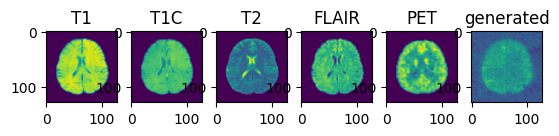

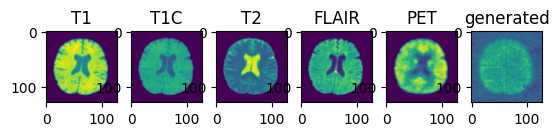

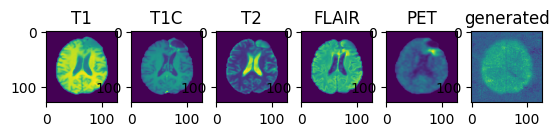

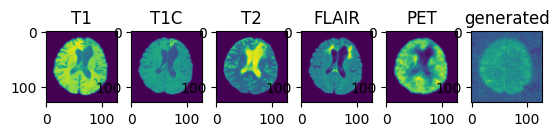

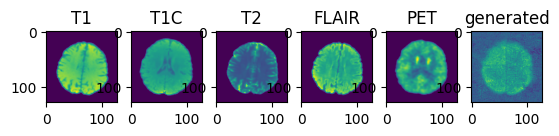

validation avg MS-SSIM: 0.4137 , train avg MS-SSIM: 0.4065
----------
epoch 121/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:03, 82.13s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:57, 35.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:08, 20.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:31<01:51, 13.92s/it]

Epoch :  42%|███████████████                     | 5/12 [01:35<01:10, 10.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:38<00:46,  7.77s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:41<00:31,  6.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:45<00:21,  5.35s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:49<00:15,  5.09s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:52<00:09,  4.54s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:56<00:04,  4.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 122/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:35, 79.55s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:47, 34.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:04, 20.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:49, 13.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:10, 10.09s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:46,  7.82s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:31,  6.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:21,  5.35s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:14,  4.69s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.28s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 123/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:30, 79.10s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:45, 34.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:47, 13.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:08,  9.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.11s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:13,  4.61s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.26s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.72s/it]

----------
epoch 124/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:09, 77.23s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:37, 33.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:58, 19.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:09,  9.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:45,  7.59s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.59s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.25s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:50<00:04,  4.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  3.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 125/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:16, 77.82s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 20.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:47, 13.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:31<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:45,  7.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:41<00:21,  5.33s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:44<00:14,  4.67s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:47<00:08,  4.30s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.64s/it]

----------
epoch 126/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:34, 79.48s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:46, 34.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:30,  6.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.21s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.58s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.23s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:04,  4.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

----------
epoch 127/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:21<14:52, 81.16s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:06, 20.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:50, 13.79s/it]

Epoch :  42%|███████████████                     | 5/12 [01:34<01:09,  9.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:46,  7.70s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:31,  6.36s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:21,  5.35s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:14,  4.68s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.28s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.87s/it]

----------
epoch 128/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:39, 79.97s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:48, 34.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:05, 20.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:50, 13.80s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:09,  9.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:45,  7.66s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:31,  6.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:43<00:20,  5.23s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.59s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.15s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 129/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:20<14:49, 80.83s/it]

Epoch :  17%|██████                              | 2/12 [01:24<05:52, 35.28s/it]

Epoch :  25%|█████████                           | 3/12 [01:27<03:05, 20.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.74s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:09,  9.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:37<00:45,  7.65s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:40<00:31,  6.37s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:44<00:21,  5.38s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:47<00:14,  4.69s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:50<00:08,  4.22s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:53<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 130/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:08, 82.62s/it]

Epoch :  17%|██████                              | 2/12 [01:27<06:05, 36.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:30<03:12, 21.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:53, 14.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:11, 10.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:47,  7.87s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:43<00:32,  6.42s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:46<00:21,  5.41s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:14,  4.80s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:53<00:08,  4.36s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:57<00:04,  4.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:59<00:00,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:02<00:00, 10.20s/it]

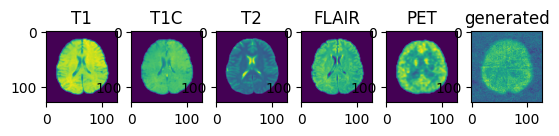

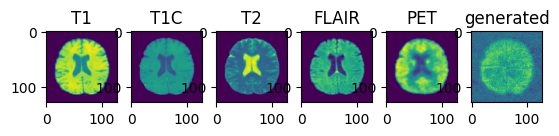

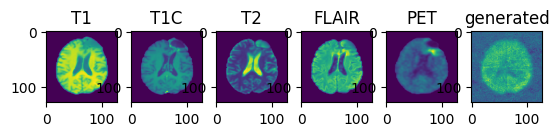

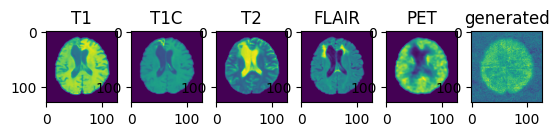

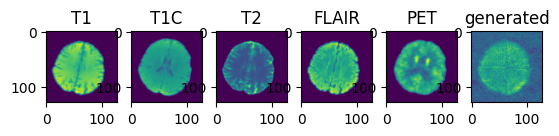

validation avg MS-SSIM: 0.4201 , train avg MS-SSIM: 0.4100
----------
epoch 131/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:48, 75.28s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:28, 32.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:53, 19.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:43, 12.89s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:05,  9.38s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.24s/it]

----------
epoch 132/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.35s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.78s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.14s/it]

----------
epoch 133/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:36, 74.25s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:24, 32.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:51, 19.03s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.55s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.15s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.41s/it]

----------
epoch 134/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:34<17:23, 94.83s/it]

Epoch :  17%|██████                              | 2/12 [01:38<06:50, 41.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:42<03:36, 24.04s/it]

Epoch :  33%|████████████                        | 4/12 [01:45<02:07, 15.96s/it]

Epoch :  42%|███████████████                     | 5/12 [01:49<01:20, 11.46s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:52<00:52,  8.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:56<00:35,  7.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:59<00:23,  5.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:02<00:15,  5.09s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:06<00:09,  4.60s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:09<00:04,  4.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:12<00:00,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00, 11.25s/it]

----------
epoch 135/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:06, 93.30s/it]

Epoch :  17%|██████                              | 2/12 [01:36<06:44, 40.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:39<03:30, 23.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:43<02:06, 15.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:47<01:18, 11.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:50<00:51,  8.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:53<00:34,  6.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:57<00:23,  5.85s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:00<00:15,  5.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:04<00:09,  4.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:07<00:04,  4.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:13<00:00, 11.10s/it]

----------
epoch 136/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:29<16:27, 89.74s/it]

Epoch :  17%|██████                              | 2/12 [01:33<06:29, 38.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:36<03:25, 22.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:40<02:02, 15.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:44<01:17, 11.09s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:47<00:50,  8.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:52<00:35,  7.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:55<00:23,  5.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:58<00:15,  5.17s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:02<00:09,  4.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:05<00:04,  4.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00,  3.82s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00, 10.99s/it]

----------
epoch 137/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:13, 93.93s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:49, 40.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:41<03:34, 23.79s/it]

Epoch :  33%|████████████                        | 4/12 [01:44<02:06, 15.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:48<01:20, 11.45s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:51<00:52,  8.73s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:55<00:35,  7.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:59<00:23,  5.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:02<00:15,  5.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:06<00:09,  4.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:09<00:04,  4.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:12<00:00,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00, 11.28s/it]

----------
epoch 138/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:34<17:24, 95.00s/it]

Epoch :  17%|██████                              | 2/12 [01:38<06:51, 41.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:41<03:35, 23.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:45<02:06, 15.85s/it]

Epoch :  42%|███████████████                     | 5/12 [01:48<01:20, 11.44s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:52<00:52,  8.77s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:56<00:35,  7.10s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:59<00:23,  5.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:02<00:15,  5.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:06<00:09,  4.76s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:10<00:04,  4.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:13<00:00,  3.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:16<00:00, 11.36s/it]

----------
epoch 139/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:35<17:34, 95.88s/it]

Epoch :  17%|██████                              | 2/12 [01:39<06:57, 41.76s/it]

Epoch :  25%|█████████                           | 3/12 [01:43<03:38, 24.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:46<02:08, 16.07s/it]

Epoch :  42%|███████████████                     | 5/12 [01:50<01:21, 11.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:54<00:54,  9.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:58<00:36,  7.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [02:01<00:24,  6.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:04<00:15,  5.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:08<00:09,  4.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:11<00:04,  4.32s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:14<00:00,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:17<00:00, 11.45s/it]

----------
epoch 140/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:35<17:27, 95.23s/it]

Epoch :  17%|██████                              | 2/12 [01:39<06:56, 41.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:42<03:38, 24.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:46<02:08, 16.04s/it]

Epoch :  42%|███████████████                     | 5/12 [01:49<01:20, 11.47s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:53<00:52,  8.78s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:56<00:35,  7.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [02:00<00:23,  5.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:04<00:15,  5.26s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:07<00:09,  4.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:10<00:04,  4.30s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:12<00:00,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00, 11.32s/it]

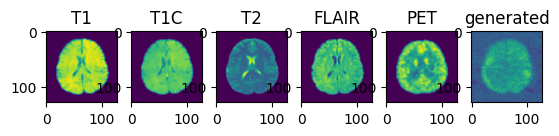

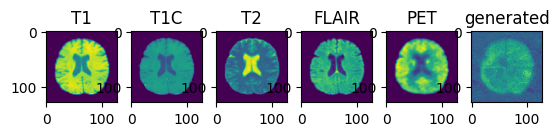

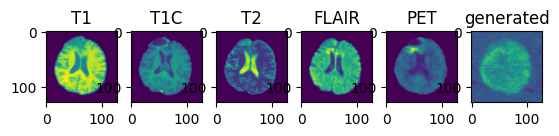

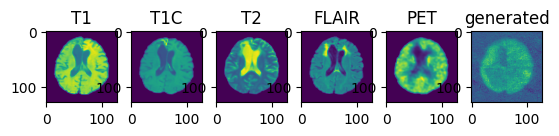

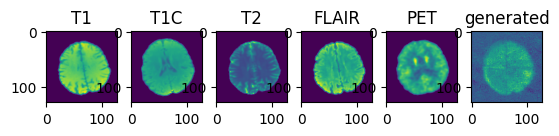

validation avg MS-SSIM: 0.4313 , train avg MS-SSIM: 0.4121
----------
epoch 141/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:12, 93.89s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:45, 40.52s/it]

Epoch :  25%|█████████                           | 3/12 [01:40<03:32, 23.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:43<02:04, 15.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:47<01:19, 11.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:51<00:51,  8.64s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:54<00:35,  7.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:58<00:23,  5.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:01<00:15,  5.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:04<00:08,  4.49s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:07<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:13<00:00, 11.12s/it]

----------
epoch 142/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:10, 93.65s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:45, 40.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:40<03:34, 23.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:44<02:05, 15.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:47<01:18, 11.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:50<00:51,  8.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:54<00:34,  6.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:57<00:23,  5.79s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:01<00:15,  5.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:05<00:09,  4.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:08<00:04,  4.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:14<00:00, 11.18s/it]

----------
epoch 143/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:30<16:36, 90.56s/it]

Epoch :  17%|██████                              | 2/12 [01:34<06:36, 39.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:38<03:28, 23.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:41<02:02, 15.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:44<01:17, 11.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:49<00:52,  8.75s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:52<00:35,  7.01s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:56<00:23,  5.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:59<00:15,  5.14s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:03<00:09,  4.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:06<00:04,  4.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00, 10.94s/it]

----------
epoch 144/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:36<17:37, 96.13s/it]

Epoch :  17%|██████                              | 2/12 [01:40<07:04, 42.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:44<03:44, 24.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:48<02:11, 16.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:52<01:23, 11.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:56<00:55,  9.24s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:59<00:36,  7.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [02:02<00:23,  5.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:06<00:15,  5.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:09<00:09,  4.58s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:12<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:14<00:00,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:17<00:00, 11.42s/it]

----------
epoch 145/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:43, 74.84s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:26, 32.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:52, 19.21s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:43, 12.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:06,  9.51s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:44,  7.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:13,  4.50s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:08,  4.09s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.29s/it]

----------
epoch 146/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:37<17:53, 97.57s/it]

Epoch :  17%|██████                              | 2/12 [01:41<07:02, 42.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:44<03:39, 24.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:48<02:10, 16.31s/it]

Epoch :  42%|███████████████                     | 5/12 [01:51<01:22, 11.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:55<00:53,  8.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:59<00:36,  7.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [02:02<00:23,  5.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:06<00:15,  5.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:09<00:09,  4.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:12<00:04,  4.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:14<00:00,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:18<00:00, 11.54s/it]

----------
epoch 147/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:10, 93.67s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:46, 40.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:40<03:32, 23.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:43<02:05, 15.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:47<01:19, 11.34s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:50<00:51,  8.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:54<00:34,  6.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:57<00:23,  5.82s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:01<00:15,  5.12s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:04<00:09,  4.58s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:08<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:14<00:00, 11.18s/it]

----------
epoch 148/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:34<17:21, 94.65s/it]

Epoch :  17%|██████                              | 2/12 [01:38<06:51, 41.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:42<03:36, 24.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:45<02:07, 15.95s/it]

Epoch :  42%|███████████████                     | 5/12 [01:49<01:20, 11.53s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:52<00:52,  8.72s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:56<00:35,  7.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:59<00:23,  5.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:03<00:16,  5.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:07<00:09,  4.77s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:10<00:04,  4.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:12<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00, 11.33s/it]

----------
epoch 149/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:34<17:20, 94.63s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:48, 40.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:42<03:38, 24.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:46<02:09, 16.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:49<01:21, 11.59s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:53<00:53,  8.92s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:56<00:35,  7.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [02:00<00:23,  5.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:03<00:15,  5.18s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:07<00:09,  4.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:11<00:04,  4.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:13<00:00,  3.81s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:16<00:00, 11.37s/it]

----------
epoch 150/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:32<16:53, 92.10s/it]

Epoch :  17%|██████                              | 2/12 [01:35<06:39, 39.98s/it]

Epoch :  25%|█████████                           | 3/12 [01:39<03:29, 23.30s/it]

Epoch :  33%|████████████                        | 4/12 [01:42<02:04, 15.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:46<01:18, 11.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:50<00:51,  8.66s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:54<00:35,  7.17s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:57<00:23,  5.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:01<00:15,  5.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:04<00:09,  4.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:08<00:04,  4.33s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:13<00:00, 11.12s/it]

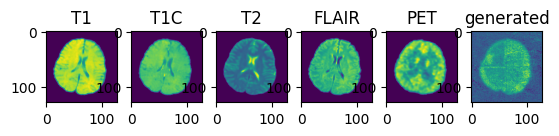

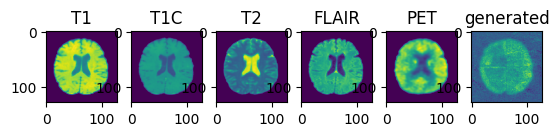

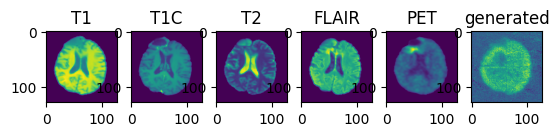

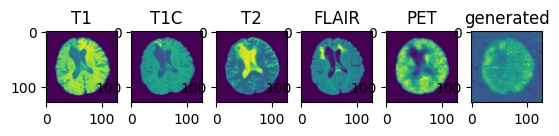

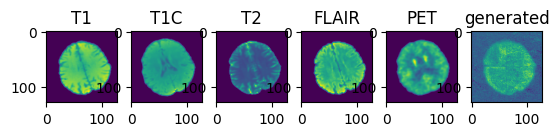

validation avg MS-SSIM: 0.4454 , train avg MS-SSIM: 0.4285
----------
epoch 151/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:39<18:10, 99.18s/it]

Epoch :  17%|██████                              | 2/12 [01:42<07:07, 42.80s/it]

Epoch :  25%|█████████                           | 3/12 [01:45<03:43, 24.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:49<02:11, 16.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:52<01:21, 11.71s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:57<00:56,  9.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [02:01<00:37,  7.50s/it]

Epoch :  67%|████████████████████████            | 8/12 [02:05<00:25,  6.33s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:08<00:16,  5.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:12<00:09,  4.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:15<00:04,  4.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:17<00:00,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:20<00:00, 11.71s/it]

----------
epoch 152/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:36<17:44, 96.82s/it]

Epoch :  17%|██████                              | 2/12 [01:40<07:00, 42.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:44<03:40, 24.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:47<02:09, 16.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:51<01:21, 11.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:54<00:52,  8.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:57<00:35,  7.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [02:01<00:23,  5.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:05<00:16,  5.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:09<00:09,  4.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:12<00:04,  4.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:17<00:00, 11.49s/it]

----------
epoch 153/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:04, 93.14s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:46, 40.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:40<03:33, 23.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:44<02:05, 15.68s/it]

Epoch :  42%|███████████████                     | 5/12 [01:48<01:20, 11.49s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:51<00:52,  8.74s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:55<00:35,  7.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:59<00:24,  6.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:02<00:16,  5.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:06<00:09,  4.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:10<00:04,  4.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:12<00:00,  3.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00, 11.28s/it]

----------
epoch 154/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:30<16:34, 90.37s/it]

Epoch :  17%|██████                              | 2/12 [01:33<06:31, 39.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:37<03:26, 22.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:40<02:01, 15.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:44<01:17, 11.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:47<00:50,  8.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:51<00:33,  6.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:54<00:22,  5.66s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:58<00:15,  5.16s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:01<00:09,  4.59s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:05<00:04,  4.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00, 10.89s/it]

----------
epoch 155/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:34<17:21, 94.66s/it]

Epoch :  17%|██████                              | 2/12 [01:38<06:49, 40.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:41<03:35, 23.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:45<02:07, 15.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:49<01:20, 11.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:52<00:52,  8.73s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:55<00:34,  6.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:59<00:23,  5.84s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:02<00:15,  5.16s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:06<00:09,  4.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:09<00:04,  4.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:12<00:00,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:15<00:00, 11.29s/it]

----------
epoch 156/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:09, 93.56s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:46, 40.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:40<03:33, 23.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:44<02:07, 15.94s/it]

Epoch :  42%|███████████████                     | 5/12 [01:48<01:20, 11.55s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:52<00:52,  8.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:55<00:36,  7.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [02:00<00:25,  6.32s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:04<00:16,  5.51s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:07<00:09,  4.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:11<00:04,  4.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:13<00:00,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:16<00:00, 11.41s/it]

----------
epoch 157/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:29, 79.09s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:01, 20.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:53, 14.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:11, 10.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:46,  7.80s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:31,  6.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.27s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:46<00:13,  4.60s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:49<00:08,  4.14s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:52<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

----------
epoch 158/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:05, 82.33s/it]

Epoch :  17%|██████                              | 2/12 [01:26<06:00, 36.10s/it]

Epoch :  25%|█████████                           | 3/12 [01:29<03:11, 21.30s/it]

Epoch :  33%|████████████                        | 4/12 [01:33<01:54, 14.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:36<01:12, 10.38s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:40<00:48,  8.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:44<00:33,  6.71s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:47<00:22,  5.65s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:50<00:14,  4.91s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:54<00:09,  4.51s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:58<00:04,  4.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:00<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:04<00:00, 10.34s/it]

----------
epoch 159/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:32<16:59, 92.64s/it]

Epoch :  17%|██████                              | 2/12 [01:36<06:41, 40.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:39<03:31, 23.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:43<02:05, 15.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:46<01:19, 11.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:50<00:51,  8.65s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:53<00:34,  6.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:57<00:23,  5.78s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:00<00:14,  5.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:05<00:10,  5.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:08<00:04,  4.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00,  3.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:14<00:00, 11.20s/it]

----------
epoch 160/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:33<17:09, 93.63s/it]

Epoch :  17%|██████                              | 2/12 [01:37<06:47, 40.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:40<03:33, 23.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:44<02:05, 15.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:47<01:18, 11.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:51<00:53,  8.88s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:55<00:35,  7.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:58<00:23,  5.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [02:02<00:15,  5.14s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:05<00:09,  4.54s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:08<00:04,  4.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:14<00:00, 11.22s/it]

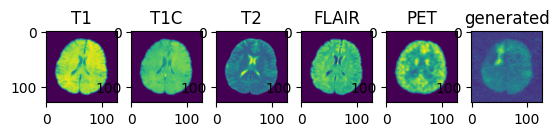

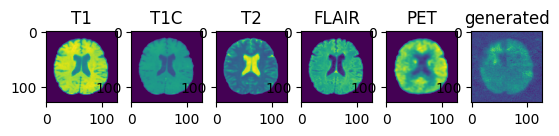

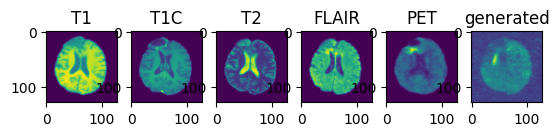

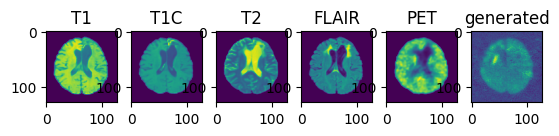

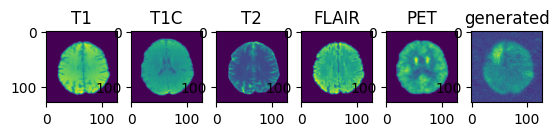

validation avg MS-SSIM: 0.4290 , train avg MS-SSIM: 0.4121
----------
epoch 161/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:31<16:45, 91.44s/it]

Epoch :  17%|██████                              | 2/12 [01:34<06:37, 39.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:38<03:27, 23.09s/it]

Epoch :  33%|████████████                        | 4/12 [01:41<02:02, 15.29s/it]

Epoch :  42%|███████████████                     | 5/12 [01:45<01:19, 11.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:49<00:51,  8.64s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:52<00:34,  6.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:56<00:23,  5.78s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:59<00:15,  5.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:02<00:09,  4.50s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:06<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:08<00:00,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:11<00:00, 10.95s/it]

----------
epoch 162/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:31<16:42, 91.13s/it]

Epoch :  17%|██████                              | 2/12 [01:34<06:34, 39.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:37<03:26, 22.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:41<02:02, 15.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:44<01:16, 10.98s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:47<00:50,  8.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:51<00:33,  6.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:55<00:23,  5.81s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:58<00:15,  5.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [02:01<00:09,  4.51s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [02:05<00:04,  4.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:07<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [02:10<00:00, 10.88s/it]

----------
epoch 163/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:20, 78.24s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 20.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:51, 13.96s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:10, 10.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:46,  7.72s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:38<00:31,  6.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.27s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.65s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.18s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.67s/it]

----------
epoch 164/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.33s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.08s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.53s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.10s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.13s/it]

----------
epoch 165/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:17, 72.46s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:45, 13.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:07,  9.58s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:44,  7.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.49s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.17s/it]

----------
epoch 166/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:14, 72.27s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.63s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.48s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

----------
epoch 167/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:28, 73.50s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.10s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.87s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.79s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.12s/it]

----------
epoch 168/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.63s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.34s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.40s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.06s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 169/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:08, 71.67s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.96s/it]

----------
epoch 170/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:12, 72.06s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

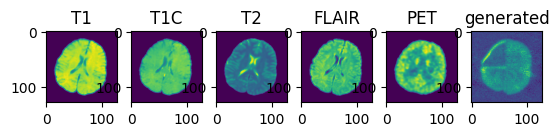

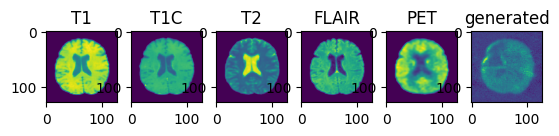

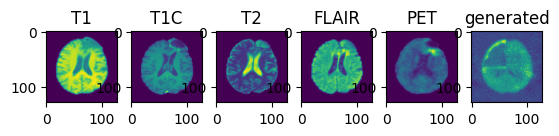

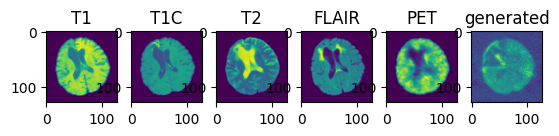

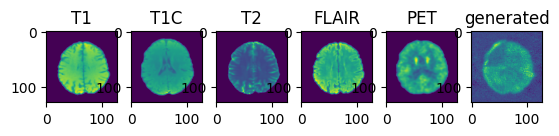

validation avg MS-SSIM: 0.4496 , train avg MS-SSIM: 0.4331
----------
epoch 171/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:08, 71.66s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:43,  7.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.98s/it]

----------
epoch 172/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.96s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.50s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.58s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.11s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 173/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:17, 72.48s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:05,  9.39s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.27s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 174/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:27, 73.41s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.54s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.10s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.15s/it]

----------
epoch 175/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:01, 71.03s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:07,  9.67s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:44,  7.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.49s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.02s/it]

----------
epoch 176/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:08, 71.67s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.40s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.96s/it]

----------
epoch 177/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:41, 69.18s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:04, 30.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.15s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:28,  5.71s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.79s/it]

----------
epoch 178/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:59, 70.83s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:10, 31.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.26s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.87s/it]

----------
epoch 179/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:31, 73.78s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:24, 32.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:51, 19.04s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.27s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.11s/it]

----------
epoch 180/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:54, 70.37s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.80s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.84s/it]

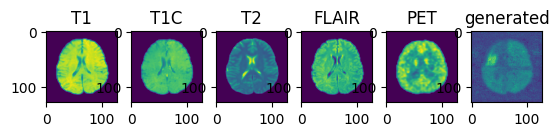

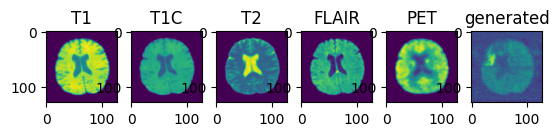

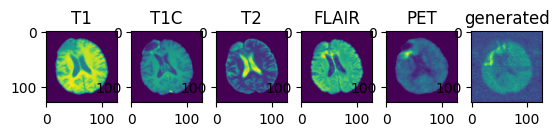

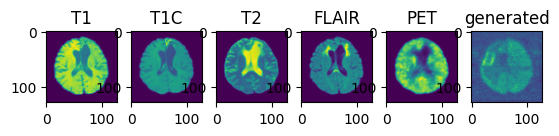

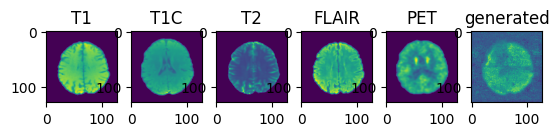

validation avg MS-SSIM: 0.4086 , train avg MS-SSIM: 0.3920
----------
epoch 181/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:49, 69.98s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:06, 30.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.08s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.92s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.79s/it]

----------
epoch 182/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.81s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.08s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 183/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.75s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.80s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.21s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

----------
epoch 184/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:21, 72.84s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.02s/it]

----------
epoch 185/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:53, 70.29s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.19s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.87s/it]

----------
epoch 186/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<13:00, 70.95s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:10, 31.08s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.31s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.99s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.88s/it]

----------
epoch 187/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:14, 72.23s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.56s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 188/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.74s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 189/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:28, 73.48s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.08s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.09s/it]

----------
epoch 190/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:55, 70.52s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.21s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.85s/it]

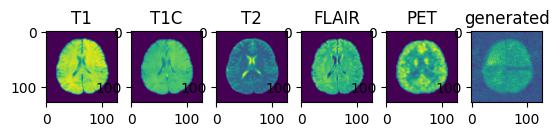

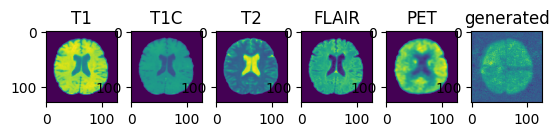

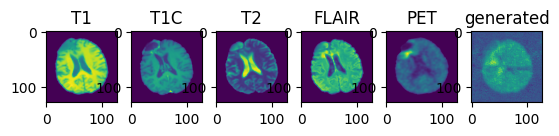

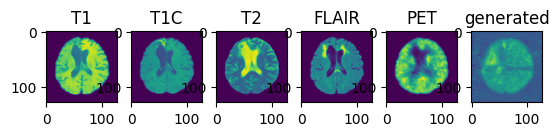

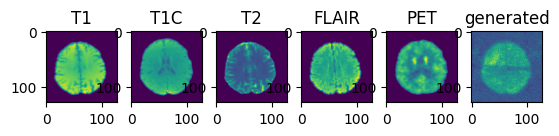

validation avg MS-SSIM: 0.4255 , train avg MS-SSIM: 0.4075
----------
epoch 191/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:49, 69.93s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:06, 30.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.07s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.16s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.79s/it]

----------
epoch 192/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:25, 73.27s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 32.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.12s/it]

----------
epoch 193/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:16, 72.38s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.21s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 194/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:54, 70.37s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:10, 31.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:44, 18.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.29s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.71s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.87s/it]

----------
epoch 195/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.32s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.21s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 196/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:10, 71.90s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.52s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.93s/it]

----------
epoch 197/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.57s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.98s/it]

----------
epoch 198/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.14s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.36s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.91s/it]

----------
epoch 199/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:58, 70.75s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:10, 31.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:51, 19.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:42, 12.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:05,  9.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:04,  4.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 200/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:08, 71.70s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.37s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

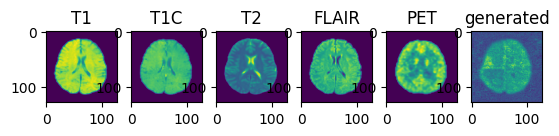

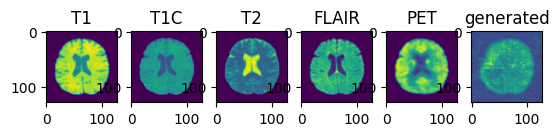

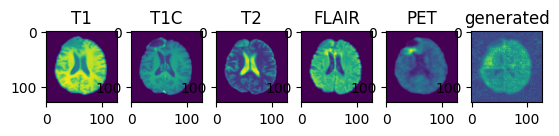

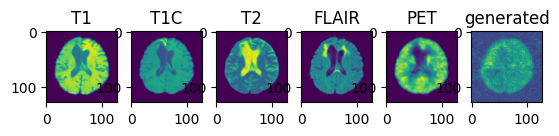

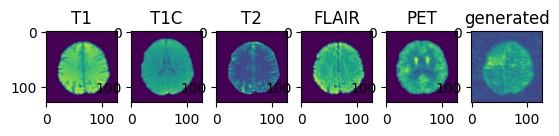

validation avg MS-SSIM: 0.4510 , train avg MS-SSIM: 0.4376
----------
epoch 201/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:16, 72.39s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 202/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:40, 69.18s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:03, 30.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:43, 18.12s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.95s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:28,  5.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.78s/it]

----------
epoch 203/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.57s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.32s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.96s/it]

----------
epoch 204/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:58, 70.79s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.44s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 205/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.80s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:14, 31.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.48s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.06s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 206/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:06, 71.50s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.28s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 207/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:27, 73.37s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.10s/it]

----------
epoch 208/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:17, 72.49s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.89s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

----------
epoch 209/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:51, 70.11s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:07, 30.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.12s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.81s/it]

----------
epoch 210/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.94s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

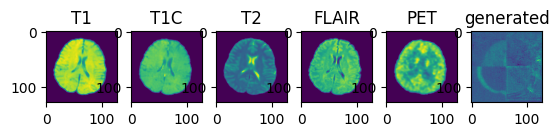

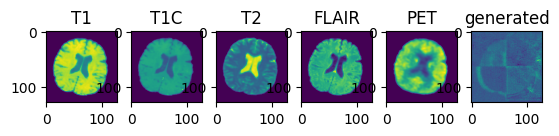

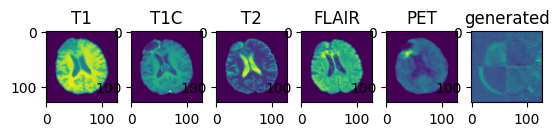

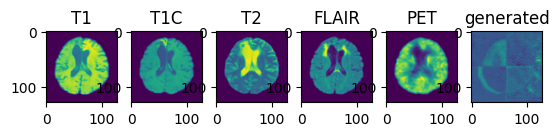

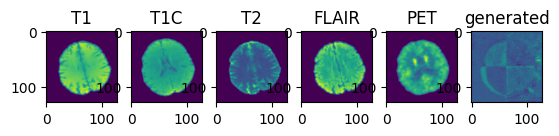

validation avg MS-SSIM: 0.0000 , train avg MS-SSIM: 0.0004
----------
epoch 211/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.57s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:49, 18.79s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 212/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:59, 70.83s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:10, 31.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.99s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.99s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.89s/it]

----------
epoch 213/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:10, 71.87s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:14, 31.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.51s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.00s/it]

----------
epoch 214/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:41, 74.65s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:25, 32.56s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:52, 19.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:42, 12.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:05,  9.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.49s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.20s/it]

----------
epoch 215/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.95s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 216/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:13, 72.16s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  9.00s/it]

----------
epoch 217/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:23, 73.02s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.89s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.66s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 218/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:14, 72.18s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.57s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 219/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.62s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 220/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.17s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.36s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.93s/it]

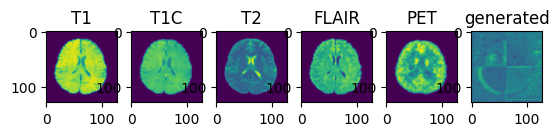

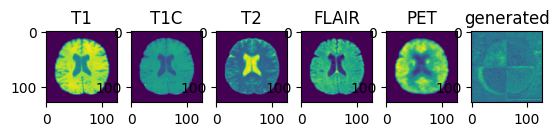

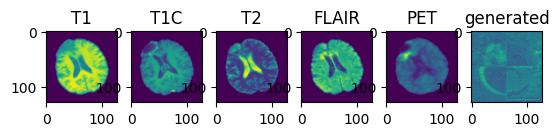

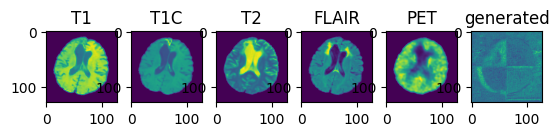

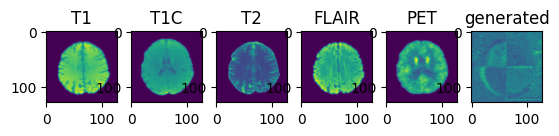

validation avg MS-SSIM: 0.0000 , train avg MS-SSIM: 0.0003
----------
epoch 221/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.31s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 222/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.15s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.34s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 223/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:04, 71.30s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.38s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.95s/it]

----------
epoch 224/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.76s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.06s/it]

----------
epoch 225/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.97s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 226/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:04, 71.28s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 227/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:28, 73.52s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.27s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.13s/it]

----------
epoch 228/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:46, 69.66s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:05, 30.52s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:42, 18.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:36, 12.12s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.90s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:28,  5.65s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.77s/it]

----------
epoch 229/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.97s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 230/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:23, 73.05s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.89s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

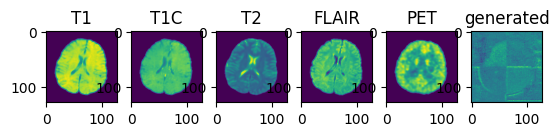

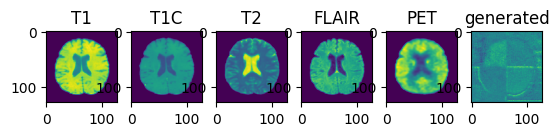

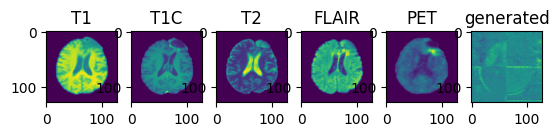

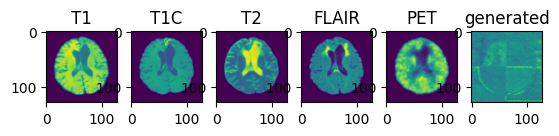

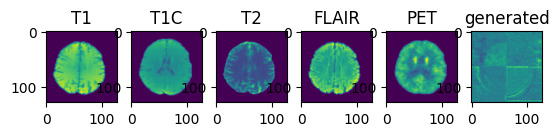

validation avg MS-SSIM: 0.0186 , train avg MS-SSIM: 0.0121
----------
epoch 231/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:27, 73.37s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.49s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 232/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.40s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:07,  9.58s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:44,  7.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.99s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.49s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 233/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:12, 72.01s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.50s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.54s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.10s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 234/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:56, 70.55s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.84s/it]

----------
epoch 235/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:10, 71.88s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.44s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.51s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 236/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:58, 70.76s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:10, 31.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.90s/it]

----------
epoch 237/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:13, 72.17s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.57s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.98s/it]

----------
epoch 238/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.55s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 239/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.43s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 240/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.79s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:53, 19.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:43, 12.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.39s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.13s/it]

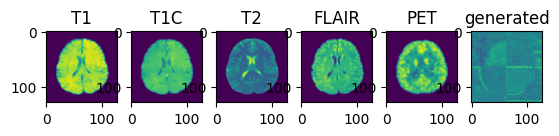

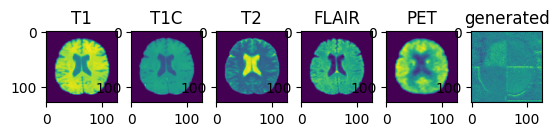

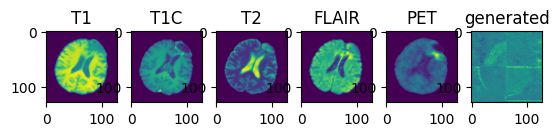

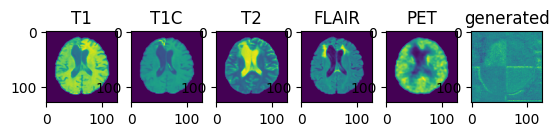

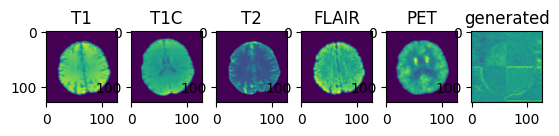

validation avg MS-SSIM: 0.0144 , train avg MS-SSIM: 0.0123
----------
epoch 241/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.77s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.27s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.09s/it]

----------
epoch 242/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:53, 70.34s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:38, 12.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.96s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.85s/it]

----------
epoch 243/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:24, 73.16s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.94s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.10s/it]

----------
epoch 244/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:06, 71.47s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 245/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.60s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.32s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 246/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<13:00, 70.97s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:10, 31.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.31s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.00s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.90s/it]

----------
epoch 247/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.98s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  9.00s/it]

----------
epoch 248/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.77s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 249/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.39s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.95s/it]

----------
epoch 250/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.55s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

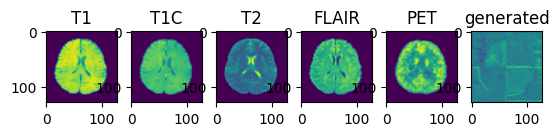

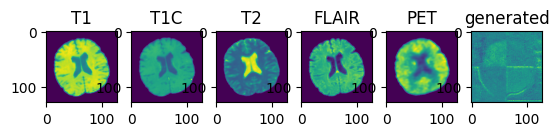

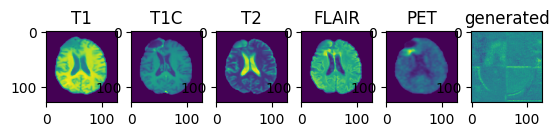

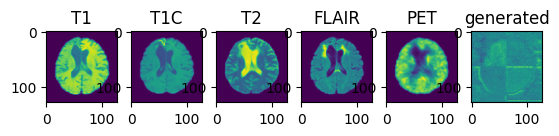

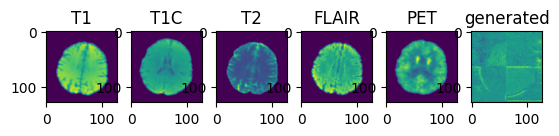

validation avg MS-SSIM: 0.0087 , train avg MS-SSIM: 0.0125
----------
epoch 251/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:15, 72.36s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:28, 32.81s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:53, 19.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:43, 12.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:05,  9.42s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.48s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:08,  4.19s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.24s/it]

----------
epoch 252/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.91s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.95s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.65s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.10s/it]

----------
epoch 253/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:15, 72.29s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.52s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.09s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.06s/it]

----------
epoch 254/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:40, 74.63s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:26, 32.62s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:52, 19.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:42, 12.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:06,  9.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:44,  7.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:29,  5.96s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.23s/it]

----------
epoch 255/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:31, 73.74s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.11s/it]

----------
epoch 256/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.12s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.89s/it]

----------
epoch 257/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:31, 73.74s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.08s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.13s/it]

----------
epoch 258/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:16, 72.44s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.22s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.48s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.13s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.06s/it]

----------
epoch 259/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.62s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.56s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.10s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 260/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.80s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:14, 31.40s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.48s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.06s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.96s/it]

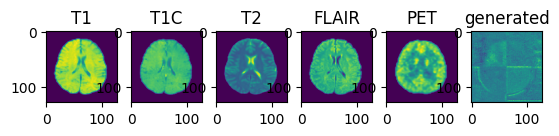

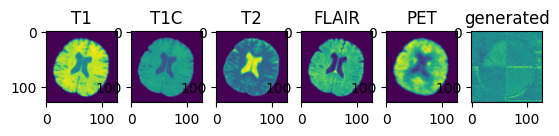

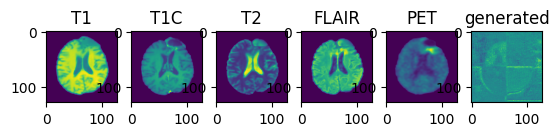

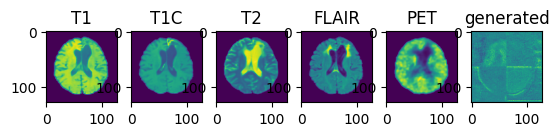

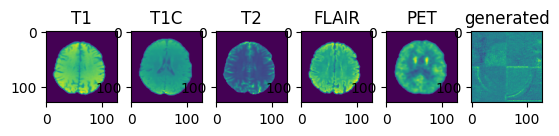

validation avg MS-SSIM: 0.0146 , train avg MS-SSIM: 0.0119
----------
epoch 261/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.60s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 262/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.79s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.38s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 263/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.16s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  7.00s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 264/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:15, 72.30s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:27, 32.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:53, 19.25s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:43, 12.92s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:04,  4.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.24s/it]

----------
epoch 265/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.77s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.38s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.48s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 266/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:24, 73.10s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.65s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 267/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:04, 71.30s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 268/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:17, 72.51s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 269/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:24, 73.16s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.22s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.06s/it]

----------
epoch 270/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.55s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.09s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

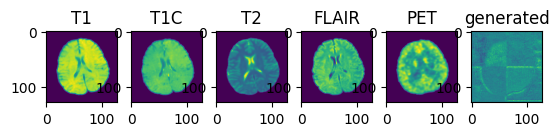

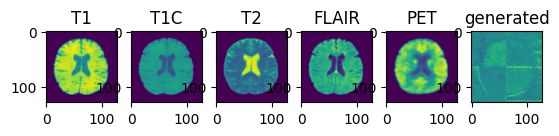

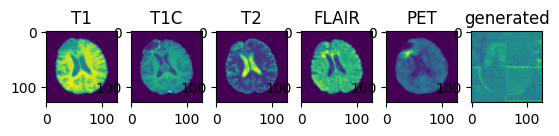

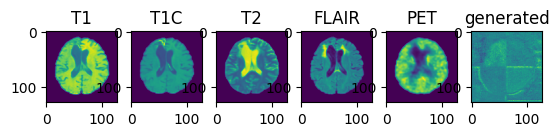

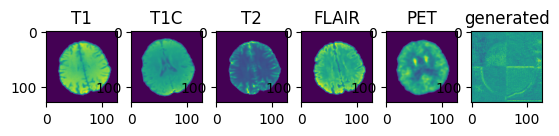

validation avg MS-SSIM: 0.0166 , train avg MS-SSIM: 0.0126
----------
epoch 271/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:19, 72.70s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.11s/it]

----------
epoch 272/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.58s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.00s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 273/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.16s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.34s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 274/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:17, 72.54s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 275/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:10, 71.90s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 276/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:57, 70.69s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:10, 31.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.98s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  7.00s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.85s/it]

----------
epoch 277/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:38, 74.40s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:24, 32.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:51, 19.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:43, 12.90s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:05,  9.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.19s/it]

----------
epoch 278/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.29s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.48s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.09s/it]

----------
epoch 279/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:19, 72.71s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.80s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:05,  9.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.06s/it]

----------
epoch 280/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:29, 73.55s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.52s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.09s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.13s/it]

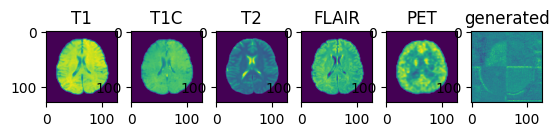

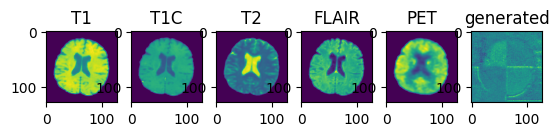

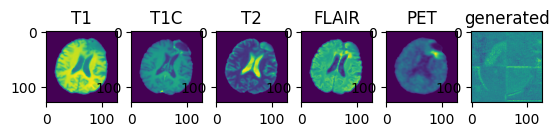

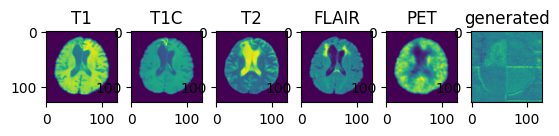

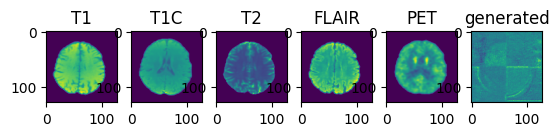

validation avg MS-SSIM: 0.0140 , train avg MS-SSIM: 0.0128
----------
epoch 281/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:45, 75.02s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:37, 33.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:58, 19.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:46, 13.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:07,  9.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:44,  7.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.66s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:08,  4.21s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.44s/it]

----------
epoch 282/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.80s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.45s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:05,  9.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.22s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.02s/it]

----------
epoch 283/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:19, 72.66s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.18s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.09s/it]

----------
epoch 284/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:15, 72.34s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:05,  9.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.22s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.06s/it]

----------
epoch 285/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.93s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.52s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.58s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.16s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 286/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:23, 73.04s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:43, 12.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.38s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.48s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.10s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.16s/it]

----------
epoch 287/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:16<14:02, 76.56s/it]

Epoch :  17%|██████                              | 2/12 [01:19<05:34, 33.40s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:56, 19.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:44, 13.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:06,  9.57s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:32<00:44,  7.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:35<00:30,  6.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:21,  5.28s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.63s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:08,  4.19s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.46s/it]

----------
epoch 288/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:07, 77.08s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:36, 33.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:44,  7.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.50s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:45<00:08,  4.08s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.43s/it]

----------
epoch 289/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:17<14:10, 77.30s/it]

Epoch :  17%|██████                              | 2/12 [01:20<05:36, 33.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:23<02:57, 19.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:26<01:45, 13.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:29<01:06,  9.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:44,  7.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:30,  6.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:42<00:13,  4.51s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.20s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.47s/it]

----------
epoch 290/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:21, 72.87s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

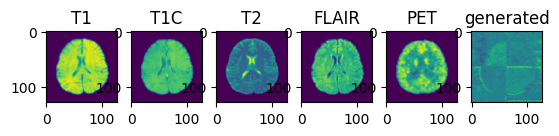

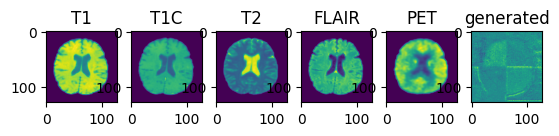

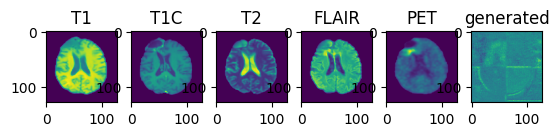

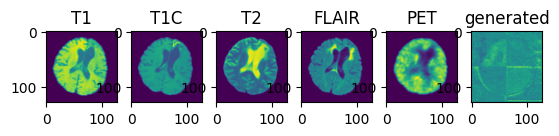

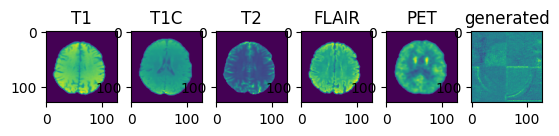

validation avg MS-SSIM: 0.0195 , train avg MS-SSIM: 0.0121
----------
epoch 291/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.32s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.50s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.08s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.09s/it]

----------
epoch 292/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.13s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.38s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 293/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:14, 72.22s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.11s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 294/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:27, 73.40s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:44,  7.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:30,  6.02s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.16s/it]

----------
epoch 295/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:55, 70.53s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.92s/it]

----------
epoch 296/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:29, 73.57s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.13s/it]

----------
epoch 297/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.60s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.27s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

----------
epoch 298/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:33, 74.00s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:22, 32.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:50, 18.97s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.50s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.16s/it]

----------
epoch 299/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.41s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 300/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:49, 75.45s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:31, 33.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:22<02:54, 19.44s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:43, 12.99s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:05,  9.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:44<00:08,  4.13s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:47<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.29s/it]

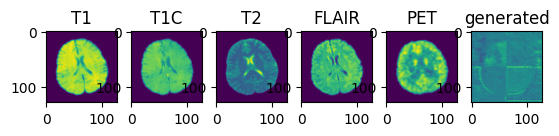

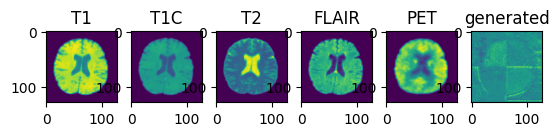

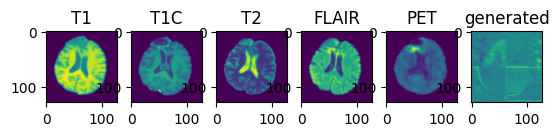

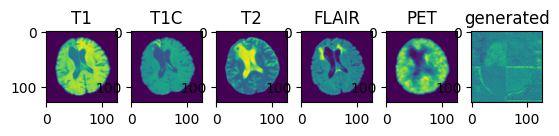

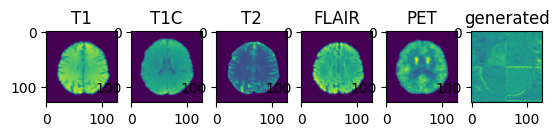

validation avg MS-SSIM: 0.0092 , train avg MS-SSIM: 0.0120
----------
epoch 301/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:25, 73.19s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.97s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.09s/it]

----------
epoch 302/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:21, 72.89s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.93s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.08s/it]

----------
epoch 303/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:25, 73.22s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:51, 19.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.74s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.27s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.14s/it]

----------
epoch 304/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:19, 72.67s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.02s/it]

----------
epoch 305/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:36, 74.22s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:27, 32.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:53, 19.25s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:43, 12.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:05,  9.42s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.97s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:08,  4.14s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.26s/it]

----------
epoch 306/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:28, 73.54s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.48s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.09s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.18s/it]

----------
epoch 307/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:13, 72.16s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:24, 32.50s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:51, 19.09s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.79s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.18s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.17s/it]

----------
epoch 308/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:30, 73.72s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:22, 32.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:50, 18.96s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.12s/it]

----------
epoch 309/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:27, 73.42s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:23, 32.32s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:50, 18.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.12s/it]

----------
epoch 310/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:10, 71.88s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:14, 31.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.51s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:43,  7.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.87s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

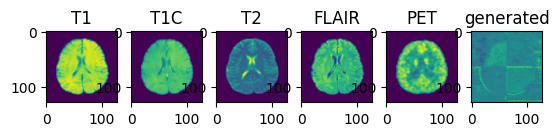

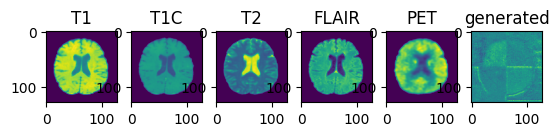

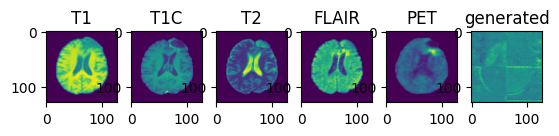

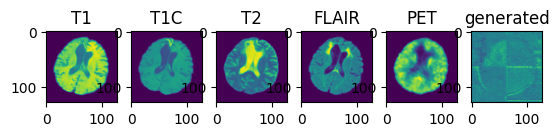

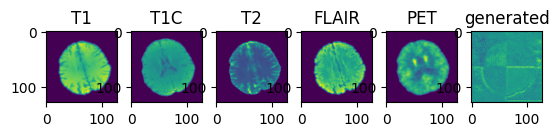

validation avg MS-SSIM: 0.0155 , train avg MS-SSIM: 0.0127
----------
epoch 311/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:15, 72.35s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.09s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.98s/it]

----------
epoch 312/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:06, 71.54s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.28s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 313/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.81s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

----------
epoch 314/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:44, 69.53s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:04, 30.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:41, 17.99s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:37, 12.15s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:06,  9.47s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:43,  7.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.91s/it]

----------
epoch 315/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.81s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.63s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 316/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:21, 72.87s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 317/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:14, 72.25s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.06s/it]

----------
epoch 318/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:24, 73.18s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 319/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:23, 73.05s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.91s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:05,  9.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.06s/it]

----------
epoch 320/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.79s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.10s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

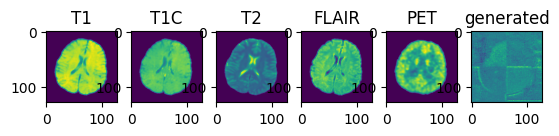

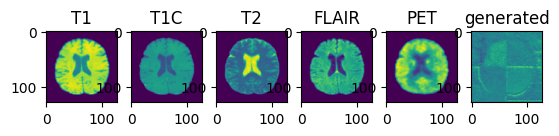

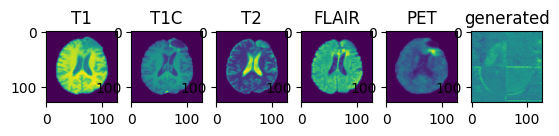

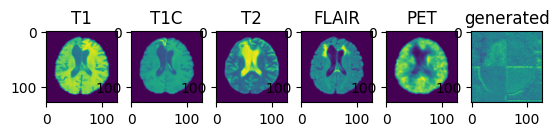

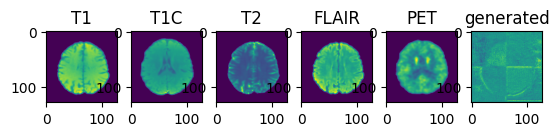

validation avg MS-SSIM: 0.0135 , train avg MS-SSIM: 0.0134
----------
epoch 321/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.81s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.81s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.66s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.12s/it]

----------
epoch 322/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:25, 73.20s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.97s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 323/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.32s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:42, 12.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 324/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.93s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.59s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 325/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.93s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.49s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.98s/it]

----------
epoch 326/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:08, 71.70s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 327/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:59, 70.86s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 31.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.26s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.87s/it]

----------
epoch 328/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:59, 70.82s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.38s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.90s/it]

----------
epoch 329/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.79s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.40s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.48s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.00s/it]

----------
epoch 330/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:19, 72.72s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.80s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.21s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

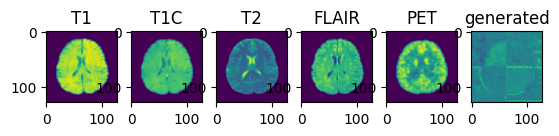

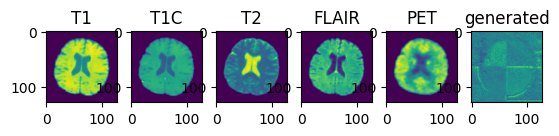

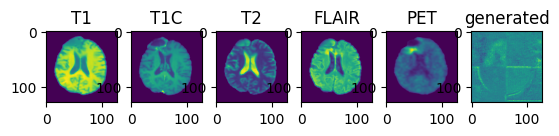

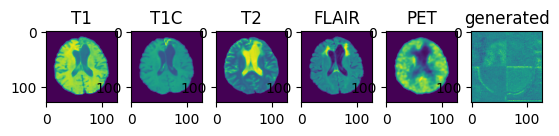

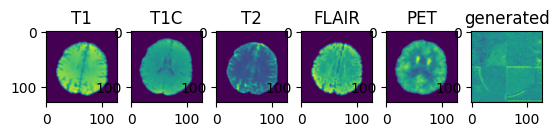

validation avg MS-SSIM: 0.0177 , train avg MS-SSIM: 0.0130
----------
epoch 331/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:41, 74.67s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:25, 32.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:52, 19.15s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:44, 13.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:06,  9.49s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:44,  7.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  9.28s/it]

----------
epoch 332/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:32, 73.87s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:22, 32.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:50, 18.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.14s/it]

----------
epoch 333/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:16, 72.40s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.66s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 334/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:19, 72.71s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 335/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:35, 74.09s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:23, 32.35s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:51, 19.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:43, 12.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:43,  7.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:50<00:00,  9.19s/it]

----------
epoch 336/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:16, 72.39s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.48s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

----------
epoch 337/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:13, 72.16s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 338/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.62s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 339/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.91s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 340/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.95s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

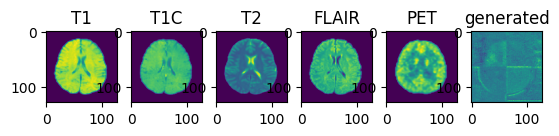

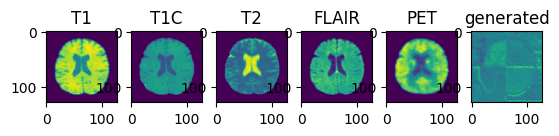

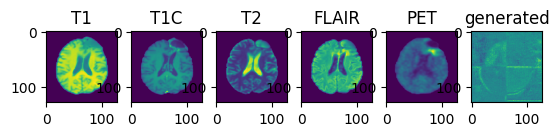

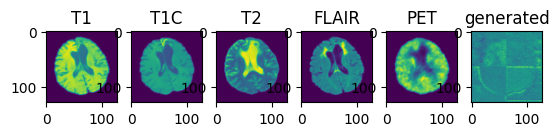

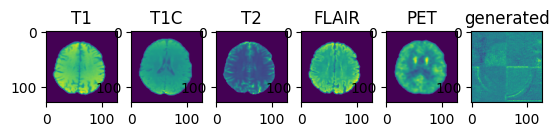

validation avg MS-SSIM: 0.0134 , train avg MS-SSIM: 0.0115
----------
epoch 341/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:48, 69.85s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:06, 30.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.10s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:03,  9.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.84s/it]

----------
epoch 342/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:49, 69.94s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.91s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:38, 12.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.96s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.97s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.71s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.84s/it]

----------
epoch 343/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:15, 72.33s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.95s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 344/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:58, 70.73s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.17s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.88s/it]

----------
epoch 345/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.30s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.10s/it]

----------
epoch 346/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.59s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 347/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:52, 70.27s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:07, 30.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.94s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:28,  5.69s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.80s/it]

----------
epoch 348/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:50, 70.04s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:06, 30.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.10s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:38, 12.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:03,  9.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  7.00s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.83s/it]

----------
epoch 349/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:17, 72.51s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.00s/it]

----------
epoch 350/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:57, 70.71s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:44, 18.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.09s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.87s/it]

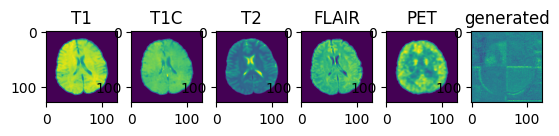

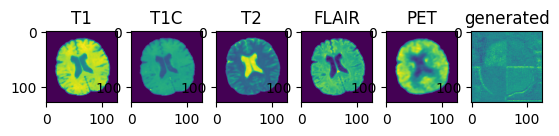

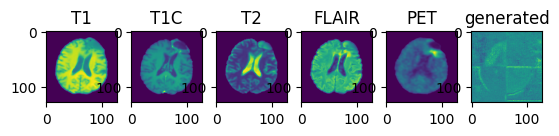

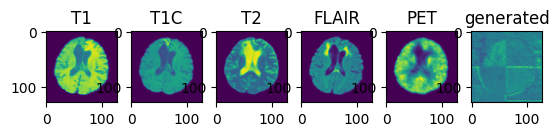

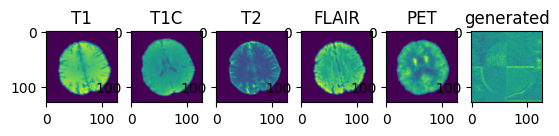

validation avg MS-SSIM: 0.0097 , train avg MS-SSIM: 0.0137
----------
epoch 351/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.92s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 352/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:14, 72.25s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.58s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.57s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.02s/it]

----------
epoch 353/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:26, 73.30s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.79s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 354/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:28, 73.49s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.77s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.10s/it]

----------
epoch 355/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:14, 72.26s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.58s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 356/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:53, 70.31s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:07, 30.79s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.15s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.21s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.84s/it]

----------
epoch 357/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.80s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.81s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 358/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:07, 71.55s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.35s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.89s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.44s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 359/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:17, 72.48s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.46s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.02s/it]

----------
epoch 360/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:56, 70.63s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:44, 18.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.29s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

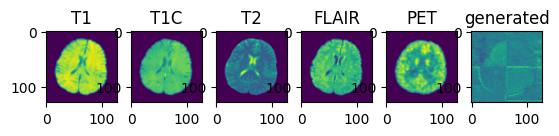

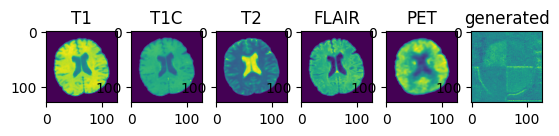

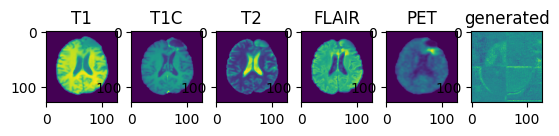

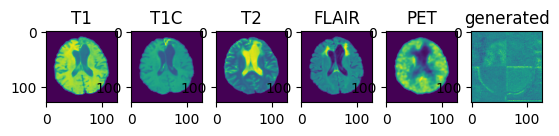

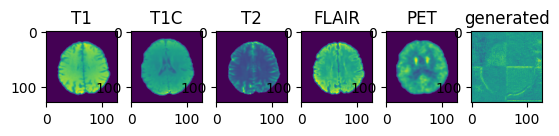

validation avg MS-SSIM: 0.0197 , train avg MS-SSIM: 0.0118
----------
epoch 361/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:21, 72.83s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.10s/it]

----------
epoch 362/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:23, 73.03s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.50s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.07s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.11s/it]

----------
epoch 363/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:58, 70.74s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:44, 18.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.09s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.68s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.85s/it]

----------
epoch 364/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:22, 72.93s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

----------
epoch 365/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.55s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 366/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:14, 72.27s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.02s/it]

----------
epoch 367/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.58s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.91s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 368/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:15, 72.30s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.63s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.07s/it]

----------
epoch 369/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.73s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.35s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.95s/it]

----------
epoch 370/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:57, 70.66s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.95s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.71s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.91s/it]

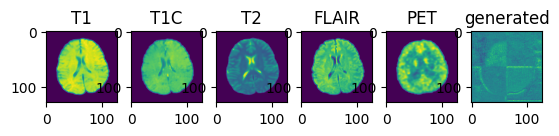

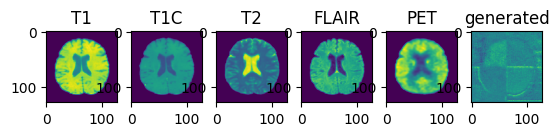

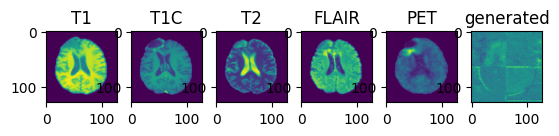

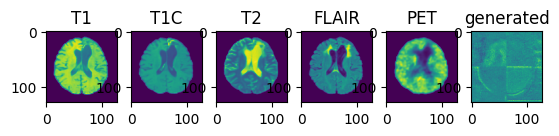

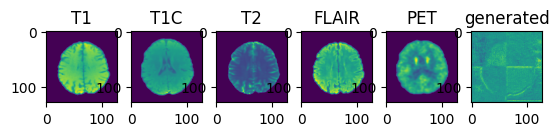

validation avg MS-SSIM: 0.0194 , train avg MS-SSIM: 0.0121
----------
epoch 371/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:04, 71.29s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.38s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 372/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.74s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.04s/it]

----------
epoch 373/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:13, 72.13s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.52s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.97s/it]

----------
epoch 374/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:13, 72.13s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  9.00s/it]

----------
epoch 375/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:56, 70.58s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.90s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.85s/it]

----------
epoch 376/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<13:00, 70.92s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:10, 31.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.97s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.88s/it]

----------
epoch 377/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:06, 71.50s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.27s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.93s/it]

----------
epoch 378/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:34, 74.01s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:23, 32.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:52, 19.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.83s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.22s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.15s/it]

----------
epoch 379/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:48, 69.90s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:07, 30.70s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.10s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:28,  5.67s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.98s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.81s/it]

----------
epoch 380/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:30, 73.64s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:42, 12.82s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.21s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.86s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.14s/it]

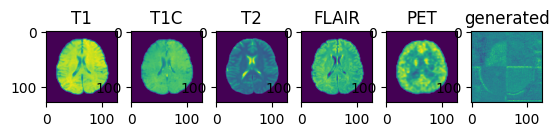

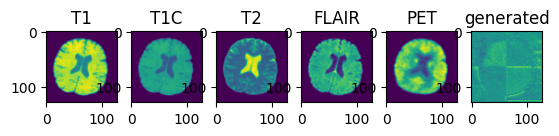

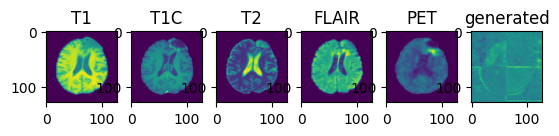

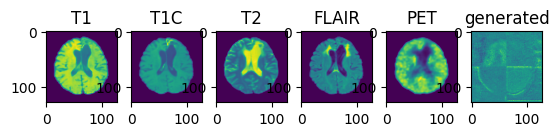

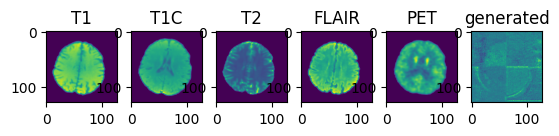

validation avg MS-SSIM: 0.0199 , train avg MS-SSIM: 0.0110
----------
epoch 381/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.43s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:43,  7.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.90s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.02s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 382/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.75s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.82s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.96s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 383/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:49, 69.95s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:06, 30.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.09s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.91s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:28,  5.67s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.80s/it]

----------
epoch 384/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:03, 71.24s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:12, 31.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.99s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.90s/it]

----------
epoch 385/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:32, 73.82s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:22, 32.24s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:50, 18.97s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.73s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:13,  4.57s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.11s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.14s/it]

----------
epoch 386/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:54, 70.37s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.83s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.17s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:05,  9.42s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:43,  7.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.92s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.42s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.92s/it]

----------
epoch 387/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.95s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.93s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.99s/it]

----------
epoch 388/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:13, 72.13s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.52s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.96s/it]

----------
epoch 389/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:55, 70.48s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.19s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.94s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.95s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.69s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.14s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.83s/it]

----------
epoch 390/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.93s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.44s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.80s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.97s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.96s/it]

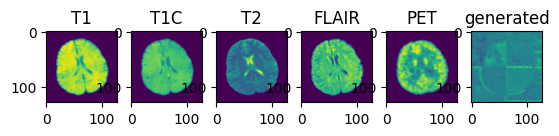

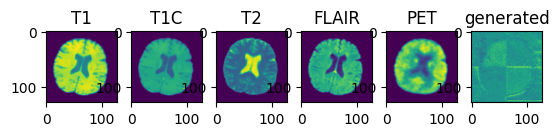

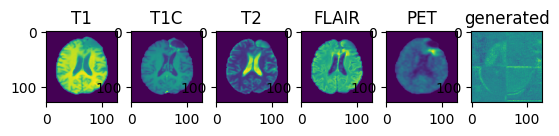

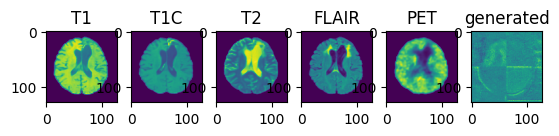

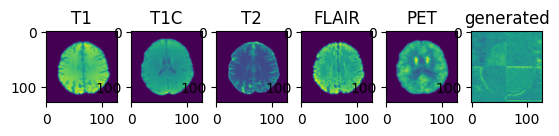

validation avg MS-SSIM: 0.0148 , train avg MS-SSIM: 0.0126
----------
epoch 391/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:17, 72.48s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.70s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.31s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.08s/it]

----------
epoch 392/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:50, 70.06s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:06, 30.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.09s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:42,  7.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.80s/it]

----------
epoch 393/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:10, 71.87s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:14, 31.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.39s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 394/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:19, 72.64s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:40, 12.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.77s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.92s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 395/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:12, 72.06s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.83s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.41s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  9.00s/it]

----------
epoch 396/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:08, 71.72s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 397/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:57, 70.68s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:10, 31.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.30s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:29,  5.84s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.98s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.43s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.90s/it]

----------
epoch 398/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.38s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:14, 31.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:08,  4.05s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.95s/it]

----------
epoch 399/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:21, 72.86s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:18, 31.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.55s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:43,  7.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:29,  5.88s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.40s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.01s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 400/400


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:56, 70.63s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.17s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.38s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:39, 12.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.06s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.35s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.96s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.89s/it]

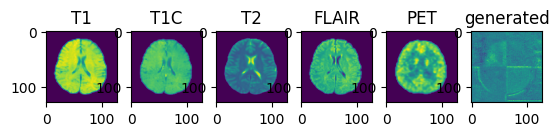

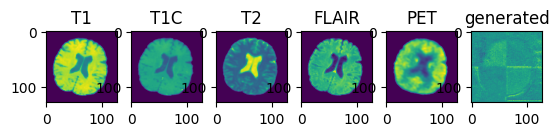

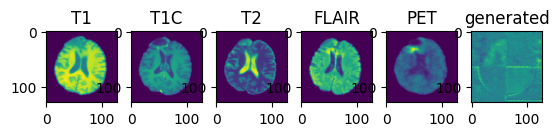

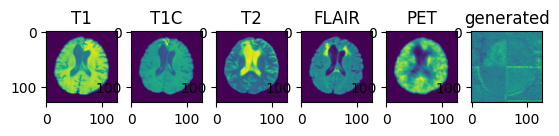

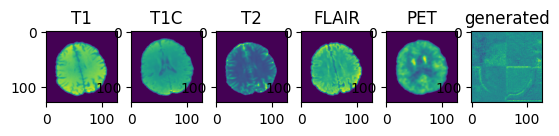

validation avg MS-SSIM: 0.0101 , train avg MS-SSIM: 0.0125


In [12]:
epoch_loss_values = [(0, 0)]
gen_step_loss = []
disc_step_loss = []
step = 0
max_epochs = 400
disc_train_interval = 1
disc_train_steps = 4
validation_interval = 10
best_ssim = 0.39
torch.cuda.empty_cache()

#Training from scratch, dont need these
#saved_dict = torch.load("./saved_models/experiment9.pth")
#gen_net.load_state_dict(saved_dict['model_state_dict'])

for epoch in range(max_epochs):
    
    gen_net.train()
    disc_net.train()
    epoch_loss = 0

    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    for batch_data in tqdm(train_loader, desc=("Epoch ")):
        input_images = torch.cat((batch_data["t1"].to(device, dtype=torch.float), 
                                 batch_data["t1c"].to(device, dtype=torch.float), 
                                 batch_data["t2"].to(device, dtype=torch.float), 
                                 batch_data["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        real_pet = batch_data["pet"].to(device, dtype=torch.float)
        
        gen_images = gen_net(input_images)
        gen_opt.zero_grad()
        loss = generator_loss(gen_images, real_pet)
        loss.backward()
        gen_opt.step()
        epoch_loss += loss.item()
        
        real_pet = real_pet[:,0,:,:,:]
        gen_images = gen_images[:,0,:,:,:]

        gen_step_loss.append((step, loss.item()))

        if step % disc_train_interval == 0:
            disc_total_loss = 0

            for _ in range(disc_train_steps):
                disc_opt.zero_grad()
                dloss = discriminator_loss(gen_images, real_pet)
                dloss.backward()
                disc_opt.step()
                disc_total_loss += dloss.item()

            disc_step_loss.append((step, disc_total_loss / disc_train_steps))
        step += 1
    
    epoch_loss /= step
    epoch_loss_values.append((step, epoch_loss))

    if (epoch+1) % validation_interval == 0:
        gen_net.eval()
        slice_index = 32
        ms_ssim = []
        ms_ssim_train = []
        ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)
        
        with torch.no_grad():

            for item in train_metric_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)
                
                generated = gen_net(input_images)
                ms_ssim_train.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))

            curr_ssim_train = torch.mean(torch.FloatTensor(ms_ssim_train))
            
            for item in valid_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

                generated = gen_net(input_images)
        
                image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
                f, axarr = plt.subplots(1, 6)

                ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
                axarr[0].imshow(image_datas[0])
                axarr[0].set_title("T1")
                axarr[1].imshow(image_datas[1])
                axarr[1].set_title("T1C")
                axarr[2].imshow(image_datas[2])
                axarr[2].set_title("T2")
                axarr[3].imshow(image_datas[3])
                axarr[3].set_title("FLAIR")
                axarr[4].imshow(image_datas[4])
                axarr[4].set_title("PET")
                axarr[5].imshow(image_datas[5].cpu())
                axarr[5].set_title("generated")
                plt.show()
                
            curr_ssim = torch.mean(torch.FloatTensor(ms_ssim))

            if curr_ssim > best_ssim:
                best_ssim = curr_ssim
                torch.save({
                        'epoch': epoch,
                        'model_state_dict': gen_net.state_dict(),
                        'optimizer_state_dict': gen_opt.state_dict(),
                        }, "best_metric_glagan.pth")
                
        print("validation avg MS-SSIM: {:.4f} , train avg MS-SSIM: {:.4f}".format(curr_ssim, curr_ssim_train))
            

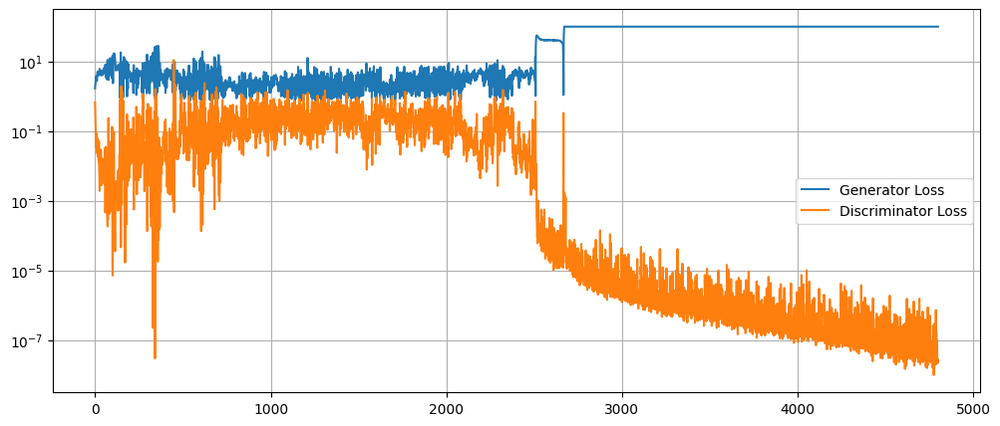

In [13]:
plt.figure(figsize=(12, 5))
plt.semilogy(*zip(*gen_step_loss), label="Generator Loss")
plt.semilogy(*zip(*disc_step_loss), label="Discriminator Loss")
plt.grid(True, "both", "both")
plt.legend()

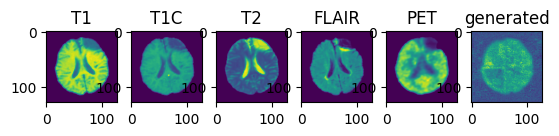

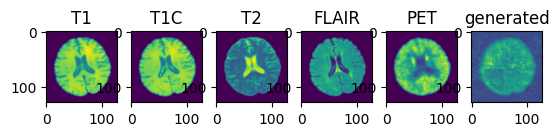

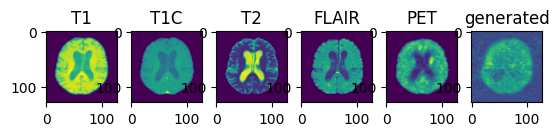

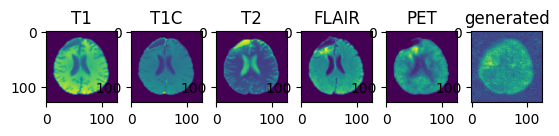

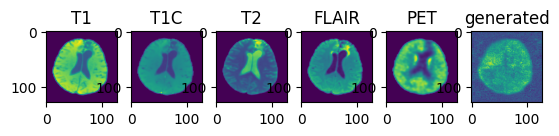

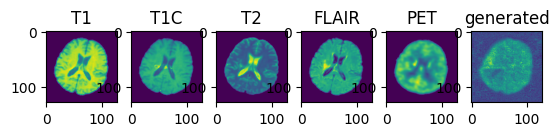

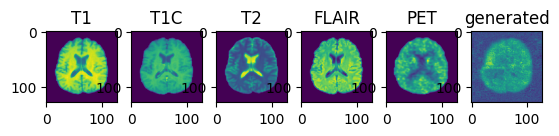

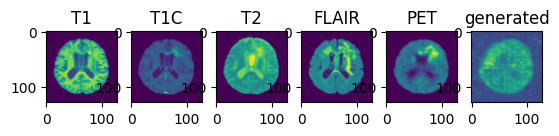

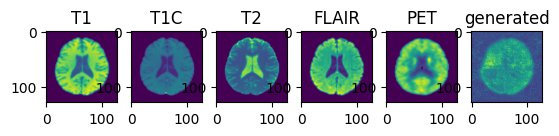

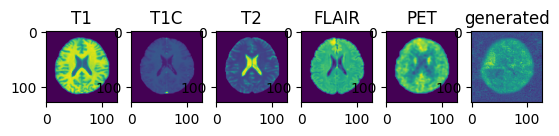

It has been 53139.07121896744 seconds since the loop started
validation avg MS-SSIM: 0.4624 validation avg MSE 0.0000


In [14]:

slice_index = 32

torch.cuda.empty_cache()

saved_dict = torch.load("best_metric_glagan.pth")
gen_net.load_state_dict(saved_dict['model_state_dict'])
gen_net.eval()

ms_ssim = []
ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)

for item in check_DataLoader:

    with torch.no_grad():
        
        input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        generated = gen_net(input_images)
        
        image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
        f, axarr = plt.subplots(1, 6)

        ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
        axarr[0].imshow(image_datas[0])
        axarr[0].set_title("T1")
        axarr[1].imshow(image_datas[1])
        axarr[1].set_title("T1C")
        axarr[2].imshow(image_datas[2])
        axarr[2].set_title("T2")
        axarr[3].imshow(image_datas[3])
        axarr[3].set_title("FLAIR")
        axarr[4].imshow(image_datas[4])
        axarr[4].set_title("PET")
        axarr[5].imshow(image_datas[5].cpu())
        axarr[5].set_title("generated")
        plt.show()


now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

print("validation avg MS-SSIM: {:.4f} validation avg MSE {:.4f}".format(torch.mean(torch.FloatTensor(ms_ssim)), 0))